In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
%matplotlib notebook
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import BaggingRegressor
from sklearn.ensemble import AdaBoostRegressor
from pandas.plotting import scatter_matrix
from sklearn.preprocessing import MinMaxScaler

# Fasi 
1. Import dei dati
2. Manipolazione dei dati
    1. Aggiunta di custom features
3. Analisi per eventuale clustering
4. Selezione delle features significative
5. Regressori
    1. Linear Regression
    2. Decision Tree
    3. Decision Tree - Bagging
    4. Decision Tree - Boosting
    5. Random Forest 
6. Conclusioni 

# 1. Import dei dati

In [2]:
data17 = pd.read_csv('properties_2017.csv')
train17 = pd.read_csv('train_2017.csv')
merge_17 = data17.merge(train17, on="parcelid", how="inner", indicator=False)
merge_17

C:\ProgramData\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3444: DtypeWarning: Columns (49) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,parcelid,airconditioningtypeid,architecturalstyletypeid,basementsqft,bathroomcnt,bedroomcnt,buildingclasstypeid,buildingqualitytypeid,calculatedbathnbr,decktypeid,...,structuretaxvaluedollarcnt,taxvaluedollarcnt,assessmentyear,landtaxvaluedollarcnt,taxamount,taxdelinquencyflag,taxdelinquencyyear,censustractandblock,logerror,transactiondate
0,17054981,NaN,NaN,NaN,5.0,4.0,NaN,NaN,5.0,NaN,...,501928.0,872850.0,2016.0,370922.0,9673.46,NaN,NaN,6.111001e+13,-0.013099,2017-06-15
1,17055743,NaN,NaN,NaN,2.0,3.0,NaN,NaN,2.0,66.0,...,130845.0,436157.0,2016.0,305312.0,5538.80,NaN,NaN,6.111001e+13,0.073985,2017-07-26
2,17068109,NaN,NaN,NaN,1.5,3.0,NaN,NaN,1.5,66.0,...,193413.0,286606.0,2016.0,93193.0,2987.36,NaN,NaN,6.111001e+13,0.071886,2017-07-28
3,17073952,NaN,NaN,NaN,2.0,2.0,NaN,NaN,2.0,NaN,...,90357.0,258888.0,2016.0,168531.0,2706.24,NaN,NaN,6.111002e+13,0.305680,2017-06-02
4,17078502,NaN,NaN,NaN,1.0,2.0,NaN,NaN,1.0,NaN,...,148752.0,592930.0,2016.0,444178.0,6220.70,NaN,NaN,6.111002e+13,-0.073787,2017-07-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77608,11928618,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.026665,2017-05-12
77609,10813418,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.008083,2017-01-03
77610,11934023,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.016600,2017-03-23
77611,11490025,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.108073,2017-03-23


**Siccome vi è una notevole quantità di valori NaN, eccetto per i campi parcelid, logerror e transactiondate, iniziamo a mitigare il problema definendo le funzioni per gestirli.**

# 2. Manipolazione dei dati

In [3]:
def is_all_nan(r):
    return sum(r.isna())==57
    
def delete_nan(df:pd.Series):
    return pd.DataFrame([df.iloc[i] for i in range(len(df)) if not is_all_nan(df.iloc[i])])

**Funzioni per trasformare i NaN di una determinata colonna con una precisa operazione**

In [4]:
def set_col_median(df, tag):
    col = df[tag].values
    val = round(np.nanmedian(col),2)
    df[tag].fillna(val, inplace=True)  

def set_col_mode(df, tag):
    val = df[tag].mode()
    df[tag].fillna(val[0], inplace=True)
    
def set_col_zero(df, tag):
    df[tag].fillna(0, inplace=True)

**In seguito ad un'analisi, sono state raggruppate delle colonne in base a come verranno trattate.**

In [5]:
to_delete = ['roomcnt','airconditioningtypeid','basementsqft','buildingclasstypeid','calculatedbathnbr','threequarterbathnbr',
             'finishedfloor1squarefeet','finishedsquarefeet6','finishedsquarefeet12','finishedsquarefeet13',
             'finishedsquarefeet15','finishedsquarefeet50','fireplaceflag','fullbathcnt','hashottuborspa',
             'pooltypeid10','pooltypeid2','pooltypeid7','propertyzoningdesc','censustractandblock','regionidcity',
             'regionidzip','regionidneighborhood','storytypeid','typeconstructiontypeid','unitcnt','yardbuildingsqft17',
             'yardbuildingsqft26','structuretaxvaluedollarcnt','landtaxvaluedollarcnt','assessmentyear','decktypeid',
             'calculatedfinishedsquarefeet', 'bedroomcnt', 'bathroomcnt', 'garagecarcnt',"fireplacecnt", 'poolcnt']
to_mode = ['architecturalstyletypeid','buildingqualitytypeid','heatingorsystemtypeid','propertycountylandusecode',
           'propertylandusetypeid','regionidcounty','yearbuilt']
to_median = ['calculatedfinishedsquarefeet','lotsizesquarefeet','numberofstories','taxvaluedollarcnt','taxamount']
to_zero = ['garagetotalsqft','garagecarcnt','fireplacecnt','poolcnt']

# 2.A. Aggiunta di custom features

**Definizione di una funzione che servirà a calcolare la prima colonna aggiuntiva: uno score che possibilmente potrà aiutare ad stimare la bontà di un'abitazione e quindi risultare utile per calcolarne il logerror.**

In [6]:
def complex_score(df, col1, col2, col3, col4, col5, col6):
    out = df[col1]*(2/3) - (df[col2]+df[col3]+df[col4])*(1/3) + df[col5] +df[col6]*50
    return np.sqrt(out)

**Funzione che applica tutte le operazioni per le quali ci si è preparati nei punti precedenti, più alcune aggiuntive per trattare casi particolari.**

In [7]:
def sanitize(df):
    df = delete_nan(df)
    
    for i in to_mode:
        set_col_mode(df,i)
        
    for i in to_median:
        set_col_median(df,i)
    
    for i in to_zero:
        set_col_zero(df,i)
    
    df['complex_score'] = complex_score(df, 'calculatedfinishedsquarefeet', 'bedroomcnt', 'bathroomcnt', 
                                            'garagecarcnt', 'fireplacecnt', 'poolcnt')
    
    zero_rooms = list(  set(df[df['bedroomcnt'] == 0].index) 
                      & set(df[df['bathroomcnt'] == 0].index) 
                      & set(df[df['garagecarcnt'] == 0].index))
    df.drop(zero_rooms, inplace=True)
    df.drop(to_delete, axis=1,inplace=True)
    df.reset_index(inplace=True)
    
    df.loc[df['taxdelinquencyflag'] == 'Y', 'taxdelinquencyflag'] = 1
    df['transactiondate'] = df['transactiondate'].apply(lambda x : int(x[5:7]))
    
    df.fillna(0, inplace=True)
    df = df.drop('index', axis=1)
    
    return df

In [8]:
merge_17 = sanitize(merge_17)
merge_17

,parcelid,architecturalstyletypeid,buildingqualitytypeid,fips,garagetotalsqft,heatingorsystemtypeid,latitude,longitude,lotsizesquarefeet,poolsizesum,...,regionidcounty,yearbuilt,numberofstories,taxvaluedollarcnt,taxamount,taxdelinquencyflag,taxdelinquencyyear,logerror,transactiondate,complex_score
0,17054981,7.0,8.0,6111.0,784.0,2.0,34449407.0,-119254052.0,42688.0,735.0,...,2061.0,1982.0,2.0,872850.0,9673.46,0,0.0,-0.013099,6,50.563491
1,17055743,7.0,8.0,6111.0,0.0,2.0,34454169.0,-119237898.0,7108.0,0.0,...,2061.0,1951.0,1.0,436157.0,5538.80,0,0.0,0.073985,7,30.994623
2,17068109,7.0,8.0,6111.0,0.0,2.0,34365693.0,-119448392.0,2588.0,0.0,...,2061.0,1979.0,1.0,286606.0,2987.36,0,0.0,0.071886,7,33.637776
3,17073952,7.0,8.0,6111.0,0.0,2.0,34305600.0,-119284000.0,7206.0,0.0,...,2061.0,1989.0,1.0,258888.0,2706.24,0,0.0,0.305680,6,25.625508
4,17078502,7.0,8.0,6111.0,621.0,2.0,34278012.0,-119257047.0,5643.0,0.0,...,2061.0,1948.0,1.0,592930.0,6220.70,0,0.0,-0.073787,7,27.916542
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77011,11770199,7.0,5.0,6037.0,0.0,7.0,34012294.0,-118246482.0,2704.0,0.0,...,3101.0,1925.0,1.0,80605.0,1074.83,0,0.0,-0.039386,7,22.949219
77012,12013838,7.0,12.0,6037.0,0.0,2.0,34100060.0,-118344916.0,7206.0,0.0,...,3101.0,2012.0,1.0,643904.0,7772.40,0,0.0,0.014659,3,29.642312
77013,14360869,7.0,8.0,6059.0,408.0,2.0,33639788.0,-117755531.0,4410.0,0.0,...,1286.0,2012.0,1.0,1409388.0,18909.38,0,0.0,0.086432,8,46.413001
77014,14157725,7.0,8.0,6059.0,667.0,2.0,33929748.0,-117801513.0,8930.0,0.0,...,1286.0,2014.0,1.0,536061.0,6244.16,0,0.0,0.043652,5,45.619806


**Definizione le colonne categoriali, per le quali verrà eseguito il one-hot encoding.**

In [9]:
cat_cols = ['propertylandusetypeid', 'propertycountylandusecode', 'architecturalstyletypeid','buildingqualitytypeid',
            'fips','heatingorsystemtypeid','regionidcounty']

In [10]:
def onehot_enc(df):
    for i in cat_cols:
        cat = list(df[i].value_counts().index[:5].astype(str)+"_"+i)
        cat.append('Other_'+i)

        indexes = pd.DataFrame(dict.fromkeys(cat,[0] * len(df)))

        for j in range(len(df)):
            id = str(df.iloc[j][i])+"_"+i
            if (id) in list(indexes.keys())[0:len(indexes)-1]:
                indexes.iloc[j][id] = 1 
            else:
                indexes.iloc[j]['Other_'+i] = 1
        df = pd.concat([df,indexes], axis=1)
        df.drop(i, axis=1, inplace=True)
    
    return df

In [11]:
merge_17 = onehot_enc(merge_17)
merge_17

,parcelid,garagetotalsqft,latitude,longitude,lotsizesquarefeet,poolsizesum,rawcensustractandblock,yearbuilt,numberofstories,taxvaluedollarcnt,...,2.0_heatingorsystemtypeid,7.0_heatingorsystemtypeid,24.0_heatingorsystemtypeid,6.0_heatingorsystemtypeid,20.0_heatingorsystemtypeid,Other_heatingorsystemtypeid,3101.0_regionidcounty,1286.0_regionidcounty,2061.0_regionidcounty,Other_regionidcounty
0,17054981,784.0,34449407.0,-119254052.0,42688.0,735.0,6.111001e+07,1982.0,2.0,872850.0,...,1,0,0,0,0,0,0,0,1,0
1,17055743,0.0,34454169.0,-119237898.0,7108.0,0.0,6.111001e+07,1951.0,1.0,436157.0,...,1,0,0,0,0,0,0,0,1,0
2,17068109,0.0,34365693.0,-119448392.0,2588.0,0.0,6.111001e+07,1979.0,1.0,286606.0,...,1,0,0,0,0,0,0,0,1,0
3,17073952,0.0,34305600.0,-119284000.0,7206.0,0.0,6.111002e+07,1989.0,1.0,258888.0,...,1,0,0,0,0,0,0,0,1,0
4,17078502,621.0,34278012.0,-119257047.0,5643.0,0.0,6.111002e+07,1948.0,1.0,592930.0,...,1,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77011,11770199,0.0,34012294.0,-118246482.0,2704.0,0.0,6.037228e+07,1925.0,1.0,80605.0,...,0,1,0,0,0,0,1,0,0,0
77012,12013838,0.0,34100060.0,-118344916.0,7206.0,0.0,6.037190e+07,2012.0,1.0,643904.0,...,1,0,0,0,0,0,1,0,0,0
77013,14360869,408.0,33639788.0,-117755531.0,4410.0,0.0,6.059063e+07,2012.0,1.0,1409388.0,...,1,0,0,0,0,0,0,1,0,0
77014,14157725,667.0,33929748.0,-117801513.0,8930.0,0.0,6.059022e+07,2014.0,1.0,536061.0,...,1,0,0,0,0,0,0,1,0,0


**Eliminiamo la colonna Other_regionidcounty perchè ha solo valori pari a 0.**

In [12]:
merge_17.drop('Other_regionidcounty', 1, inplace=True)

C:\Users\Matteo\AppData\Local\Temp/ipykernel_4860/3397251541.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  merge_17.drop('Other_regionidcounty', 1, inplace=True)


**Prendiamo in considerazione il complex_score come indice per la stima di qualità generale di una abitazione, che tiene conto di dimensione, numero di stanze e degli eventuali comfort dati a disposizione.**

<IPython.core.display.Javascript object>


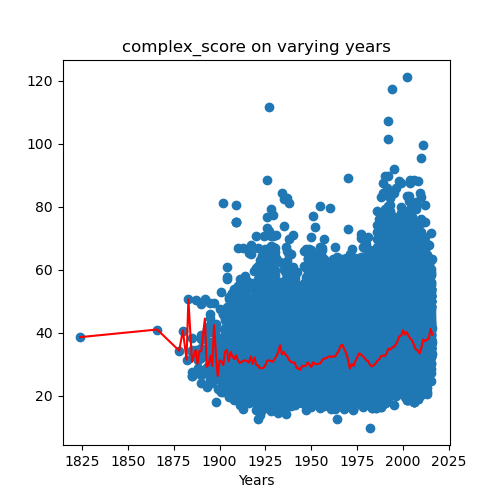

In [13]:
fig, ax = plt.subplots(figsize=(5,5))

years = sorted(merge_17['yearbuilt'].unique())
years_medians = []
for x in years:
    temp = merge_17[merge_17['yearbuilt'] == x]
    years_medians.append((np.median(temp['complex_score'])))

ax.set_title("complex_score on varying years")
ax.set_xlabel("Years")
ax.scatter(merge_17['yearbuilt'], merge_17['complex_score']);
ax.plot(years, years_medians, 'red');

**Dal grafico precedente, notiamo che la mediana del complex_score è piuttosto costante negli anni. Ora osserviamo come si comporta confrontando con il logerror. Come ci si poteva aspettare, sembra non esistere alcuna relazione nota anche con esso.**

<IPython.core.display.Javascript object>


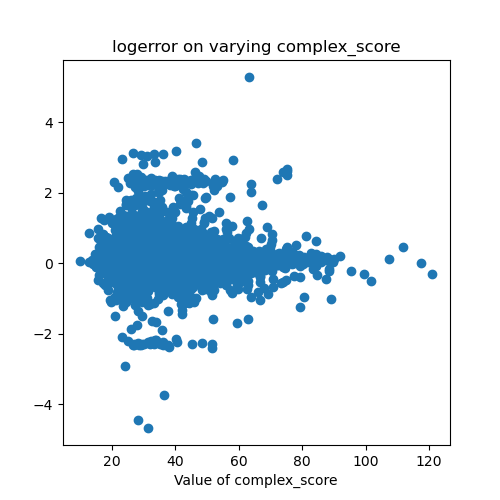

In [14]:
fig, ax = plt.subplots(figsize=(5,5))

ax.set_title("logerror on varying complex_score")
ax.set_xlabel("Value of complex_score")
ax.scatter(merge_17['complex_score'], merge_17['logerror']);

**Creiamo dunque una nuova colonna, con la mediana dei valori mensili dei logerror, sperando che possa aiutare ad indicare un valore significativo con cui potersi confrontare al momento della predizione.** 

In [15]:
d = dict.fromkeys(sorted(merge_17["transactiondate"].unique()),0)

for i in d.keys():
    d[i] = np.median(merge_17.loc[merge_17["transactiondate"] == int(i), "logerror"])

valori = []
for i in merge_17['transactiondate']:
    valori.append(d[i])
    
merge_17["median_monthly_logerror"] = valori
merge_17

,parcelid,garagetotalsqft,latitude,longitude,lotsizesquarefeet,poolsizesum,rawcensustractandblock,yearbuilt,numberofstories,taxvaluedollarcnt,...,2.0_heatingorsystemtypeid,7.0_heatingorsystemtypeid,24.0_heatingorsystemtypeid,6.0_heatingorsystemtypeid,20.0_heatingorsystemtypeid,Other_heatingorsystemtypeid,3101.0_regionidcounty,1286.0_regionidcounty,2061.0_regionidcounty,median_monthly_logerror
0,17054981,784.0,34449407.0,-119254052.0,42688.0,735.0,6.111001e+07,1982.0,2.0,872850.0,...,1,0,0,0,0,0,0,0,1,0.005049
1,17055743,0.0,34454169.0,-119237898.0,7108.0,0.0,6.111001e+07,1951.0,1.0,436157.0,...,1,0,0,0,0,0,0,0,1,0.007992
2,17068109,0.0,34365693.0,-119448392.0,2588.0,0.0,6.111001e+07,1979.0,1.0,286606.0,...,1,0,0,0,0,0,0,0,1,0.007992
3,17073952,0.0,34305600.0,-119284000.0,7206.0,0.0,6.111002e+07,1989.0,1.0,258888.0,...,1,0,0,0,0,0,0,0,1,0.005049
4,17078502,621.0,34278012.0,-119257047.0,5643.0,0.0,6.111002e+07,1948.0,1.0,592930.0,...,1,0,0,0,0,0,0,0,1,0.007992
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77011,11770199,0.0,34012294.0,-118246482.0,2704.0,0.0,6.037228e+07,1925.0,1.0,80605.0,...,0,1,0,0,0,0,1,0,0,0.007992
77012,12013838,0.0,34100060.0,-118344916.0,7206.0,0.0,6.037190e+07,2012.0,1.0,643904.0,...,1,0,0,0,0,0,1,0,0,0.003368
77013,14360869,408.0,33639788.0,-117755531.0,4410.0,0.0,6.059063e+07,2012.0,1.0,1409388.0,...,1,0,0,0,0,0,0,1,0,0.010971
77014,14157725,667.0,33929748.0,-117801513.0,8930.0,0.0,6.059022e+07,2014.0,1.0,536061.0,...,1,0,0,0,0,0,0,1,0,0.003830


**Come prima, proviamo a vedere se esistono eventuali andamenti particolari con il passare del tempo**

<IPython.core.display.Javascript object>


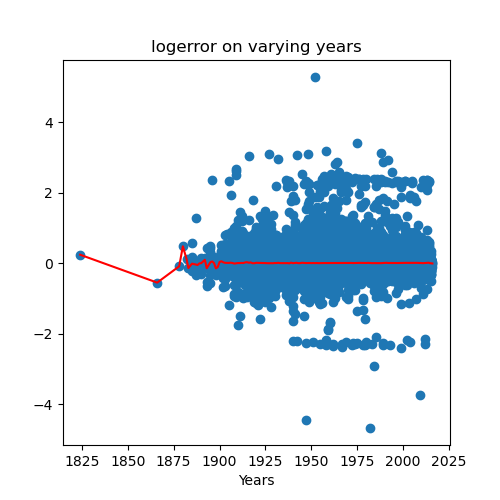

In [16]:
fig, ax = plt.subplots(figsize=(5,5))

years = sorted(merge_17['yearbuilt'].unique())
years_medians = []
for x in years:
    temp = merge_17[merge_17['yearbuilt'] == x]
    years_medians.append((np.median(temp['logerror'])))

ax.set_title("logerror on varying years")
ax.set_xlabel("Years")
ax.scatter(merge_17['yearbuilt'], merge_17['logerror']);
ax.plot(years, years_medians, 'red');

**Ora confrontiamo anche questa nuova colonna con il logerror effettivo, sperando che lo approssimi in maniera affidabile. Il logerror ha molta varianza per cui ha sempre valori che si alzano o si abbassano rispetto alla nostra mediana, ma in generale le mediane sembrano abbastanza corrette perchè passano nelle zone dove i punti sono più densi.**

<IPython.core.display.Javascript object>


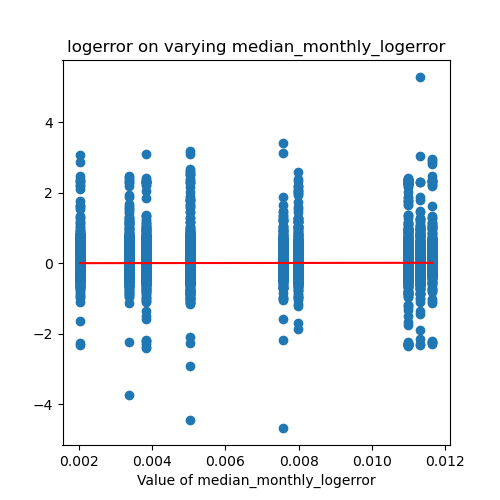

In [17]:
fig, ax = plt.subplots(figsize=(5,5))

median_monthly_logerrors = sorted(merge_17['median_monthly_logerror'].unique())

ax.set_title("logerror on varying median_monthly_logerror")
ax.set_xlabel("Value of median_monthly_logerror")
ax.scatter(merge_17['median_monthly_logerror'], merge_17['logerror']);
ax.plot(median_monthly_logerrors, median_monthly_logerrors, 'red');

# 3. Analisi per eventuale clustering

**Dal grafico del logerror nel tempo sembra che possano esserci dati clusterizzabili, indaghiamo se il logerror possa essere dato dalla contea**

**Osserviamo il numero delle case totale per ciascuna contea.**

In [18]:
print('#3101.0_regionidcounty:', sum(merge_17['3101.0_regionidcounty']))
print('#1286.0_regionidcounty:', sum(merge_17['1286.0_regionidcounty']))
print('#2061.0_regionidcounty:', sum(merge_17['2061.0_regionidcounty']))

#3101.0_regionidcounty: 50531
#1286.0_regionidcounty: 20340
#2061.0_regionidcounty: 6145


**Percentuale delle case di ciasuna contea che sono sotto una soglia che sembra significativa.**

In [19]:
print('%3101.0_regionidcounty:',  sum(merge_17[merge_17['logerror'] < -2]['3101.0_regionidcounty']) 
                                / sum(merge_17['3101.0_regionidcounty']))
print('%1286.0_regionidcounty:',  sum(merge_17[merge_17['logerror'] < -2]['1286.0_regionidcounty']) 
                                / sum(merge_17['1286.0_regionidcounty']))
print('%2061.0_regionidcounty:',  sum(merge_17[merge_17['logerror'] < -2]['2061.0_regionidcounty']) 
                                / sum(merge_17['2061.0_regionidcounty']))

%3101.0_regionidcounty: 0.00015831865587461163
%1286.0_regionidcounty: 0.001032448377581121
%2061.0_regionidcounty: 0.0011391375101708705


**Percentuale delle case di ciasuna contea che sono sopra una soglia che sembra significativa.**

In [20]:
print('%3101.0_regionidcounty:',  sum(merge_17[merge_17['logerror'] > 2]['3101.0_regionidcounty']) 
                                / sum(merge_17['3101.0_regionidcounty']))
print('%1286.0_regionidcounty:',  sum(merge_17[merge_17['logerror'] > 2]['1286.0_regionidcounty']) 
                                / sum(merge_17['1286.0_regionidcounty']))
print('%2061.0_regionidcounty:',  sum(merge_17[merge_17['logerror'] > 2]['2061.0_regionidcounty']) 
                                / sum(merge_17['2061.0_regionidcounty']))

%3101.0_regionidcounty: 0.0008905424392946904
%1286.0_regionidcounty: 0.0029006882989183872
%2061.0_regionidcounty: 0.00048820179007323027


**Percentuale delle case di ciasuna contea che sono all'interno di una soglia che sembra significativa, come possiamo vedere quasi ogni casa è qui compresa e dunque la nostra ipotesi sembra che possa essere scartata.**

In [21]:
print('%3101.0_regionidcounty:',  sum(merge_17[(merge_17['logerror'] > -2) & (merge_17['logerror'] < 2)]['3101.0_regionidcounty']) 
                                / sum(merge_17['3101.0_regionidcounty']))
print('%1286.0_regionidcounty:',  sum(merge_17[(merge_17['logerror'] > -2) & (merge_17['logerror'] < 2)]['1286.0_regionidcounty']) 
                                / sum(merge_17['1286.0_regionidcounty']))
print('%2061.0_regionidcounty:',  sum(merge_17[(merge_17['logerror'] > -2) & (merge_17['logerror'] < 2)]['2061.0_regionidcounty']) 
                                / sum(merge_17['2061.0_regionidcounty']))

%3101.0_regionidcounty: 0.9989511389048307
%1286.0_regionidcounty: 0.9960668633235005
%2061.0_regionidcounty: 0.9983726606997559


**Proviamo quindi a vedere i logerror medi di ogni contea, che hanno piccolissime variazioni che potrebbero essere date da semplici outliers e dunque non sembrano differenze significative.**

In [22]:
print('Media di logerror in:')
print('3101.0_regionidcounty:', np.mean(merge_17[merge_17['3101.0_regionidcounty'] == 1]['logerror']))
print('1286.0_regionidcounty:', np.mean(merge_17[merge_17['1286.0_regionidcounty'] == 1]['logerror']))
print('2061.0_regionidcounty:', np.mean(merge_17[merge_17['2061.0_regionidcounty'] == 1]['logerror']))

Media di logerror in:
3101.0_regionidcounty: 0.014865151994441463
1286.0_regionidcounty: 0.02119803836011627
2061.0_regionidcounty: 0.01609896951820769


**Le mediane sono ancora più vicine, a supporto dell'ipotesi citata appena sopra.**

In [23]:
print('Mediana di logerror in:')
print('3101.0_regionidcounty:', np.median(merge_17[merge_17['3101.0_regionidcounty'] == 1]['logerror']))
print('1286.0_regionidcounty:', np.median(merge_17[merge_17['1286.0_regionidcounty'] == 1]['logerror']))
print('2061.0_regionidcounty:', np.median(merge_17[merge_17['2061.0_regionidcounty'] == 1]['logerror']))

Mediana di logerror in:
3101.0_regionidcounty: 0.00647156826805
1286.0_regionidcounty: 0.0070176656779050006
2061.0_regionidcounty: 0.00685588793928


**Proviamo a fare una colonna che contenga la mediana dei logerror nelle diverse contee, come appena analizzato non ci aspettiamo molto, ma effettuiamo il test per vedere se effettivamente l'algoritmo di train non la riterrà utile**

In [24]:
median_3101 = np.median(merge_17[merge_17['3101.0_regionidcounty'] == 1]['logerror'])
median_1286 = np.median(merge_17[merge_17['1286.0_regionidcounty'] == 1]['logerror'])
median_2061 = np.median(merge_17[merge_17['2061.0_regionidcounty'] == 1]['logerror'])

regionidcounty_medians = []

for i in range(len(merge_17)):
    if merge_17.iloc[i]['3101.0_regionidcounty'] == 1:
        regionidcounty_medians.append(median_3101)
    elif merge_17.iloc[i]['1286.0_regionidcounty'] == 1:
        regionidcounty_medians.append(median_1286)
    elif merge_17.iloc[i]['2061.0_regionidcounty'] == 1:
        regionidcounty_medians.append(median_2061)    
        
merge_17['median_county_logerror'] = regionidcounty_medians
merge_17

,parcelid,garagetotalsqft,latitude,longitude,lotsizesquarefeet,poolsizesum,rawcensustractandblock,yearbuilt,numberofstories,taxvaluedollarcnt,...,7.0_heatingorsystemtypeid,24.0_heatingorsystemtypeid,6.0_heatingorsystemtypeid,20.0_heatingorsystemtypeid,Other_heatingorsystemtypeid,3101.0_regionidcounty,1286.0_regionidcounty,2061.0_regionidcounty,median_monthly_logerror,median_county_logerror
0,17054981,784.0,34449407.0,-119254052.0,42688.0,735.0,6.111001e+07,1982.0,2.0,872850.0,...,0,0,0,0,0,0,0,1,0.005049,0.006856
1,17055743,0.0,34454169.0,-119237898.0,7108.0,0.0,6.111001e+07,1951.0,1.0,436157.0,...,0,0,0,0,0,0,0,1,0.007992,0.006856
2,17068109,0.0,34365693.0,-119448392.0,2588.0,0.0,6.111001e+07,1979.0,1.0,286606.0,...,0,0,0,0,0,0,0,1,0.007992,0.006856
3,17073952,0.0,34305600.0,-119284000.0,7206.0,0.0,6.111002e+07,1989.0,1.0,258888.0,...,0,0,0,0,0,0,0,1,0.005049,0.006856
4,17078502,621.0,34278012.0,-119257047.0,5643.0,0.0,6.111002e+07,1948.0,1.0,592930.0,...,0,0,0,0,0,0,0,1,0.007992,0.006856
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77011,11770199,0.0,34012294.0,-118246482.0,2704.0,0.0,6.037228e+07,1925.0,1.0,80605.0,...,1,0,0,0,0,1,0,0,0.007992,0.006472
77012,12013838,0.0,34100060.0,-118344916.0,7206.0,0.0,6.037190e+07,2012.0,1.0,643904.0,...,0,0,0,0,0,1,0,0,0.003368,0.006472
77013,14360869,408.0,33639788.0,-117755531.0,4410.0,0.0,6.059063e+07,2012.0,1.0,1409388.0,...,0,0,0,0,0,0,1,0,0.010971,0.007018
77014,14157725,667.0,33929748.0,-117801513.0,8930.0,0.0,6.059022e+07,2014.0,1.0,536061.0,...,0,0,0,0,0,0,1,0,0.003830,0.007018


**Salviamo il df in un csv in modo da non dover più rifare tutte queste operazioni.**

In [25]:
merge_17.to_csv('merge_17.csv', sep = ',', header = True, index = False)

# 4. Selezione delle features significative

In [2]:
merge_17 = pd.read_csv('merge_17.csv')
merge_17

,parcelid,garagetotalsqft,latitude,longitude,lotsizesquarefeet,poolsizesum,rawcensustractandblock,yearbuilt,numberofstories,taxvaluedollarcnt,...,7.0_heatingorsystemtypeid,24.0_heatingorsystemtypeid,6.0_heatingorsystemtypeid,20.0_heatingorsystemtypeid,Other_heatingorsystemtypeid,3101.0_regionidcounty,1286.0_regionidcounty,2061.0_regionidcounty,median_monthly_logerror,median_county_logerror
0,17054981,784.0,34449407.0,-119254052.0,42688.0,735.0,6.111001e+07,1982.0,2.0,872850.0,...,0,0,0,0,0,0,0,1,0.005049,0.006856
1,17055743,0.0,34454169.0,-119237898.0,7108.0,0.0,6.111001e+07,1951.0,1.0,436157.0,...,0,0,0,0,0,0,0,1,0.007992,0.006856
2,17068109,0.0,34365693.0,-119448392.0,2588.0,0.0,6.111001e+07,1979.0,1.0,286606.0,...,0,0,0,0,0,0,0,1,0.007992,0.006856
3,17073952,0.0,34305600.0,-119284000.0,7206.0,0.0,6.111002e+07,1989.0,1.0,258888.0,...,0,0,0,0,0,0,0,1,0.005049,0.006856
4,17078502,621.0,34278012.0,-119257047.0,5643.0,0.0,6.111002e+07,1948.0,1.0,592930.0,...,0,0,0,0,0,0,0,1,0.007992,0.006856
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
77011,11770199,0.0,34012294.0,-118246482.0,2704.0,0.0,6.037228e+07,1925.0,1.0,80605.0,...,1,0,0,0,0,1,0,0,0.007992,0.006472
77012,12013838,0.0,34100060.0,-118344916.0,7206.0,0.0,6.037190e+07,2012.0,1.0,643904.0,...,0,0,0,0,0,1,0,0,0.003368,0.006472
77013,14360869,408.0,33639788.0,-117755531.0,4410.0,0.0,6.059063e+07,2012.0,1.0,1409388.0,...,0,0,0,0,0,0,1,0,0.010971,0.007018
77014,14157725,667.0,33929748.0,-117801513.0,8930.0,0.0,6.059022e+07,2014.0,1.0,536061.0,...,0,0,0,0,0,0,1,0,0.003830,0.007018


In [3]:
X = merge_17[list(set(merge_17.columns)-set(['logerror','parcelid']))]
y = merge_17['logerror']

**Random Forest Cross Validation per trovare il numero di alberi da usare in base al MSE**

In [5]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = RandomForestRegressor()
parameters = {'n_estimators' : [1, 5, 10, 50, 53, 100]}

tuned_model = GridSearchCV(estimator=model, param_grid = parameters, cv=5, verbose=1, scoring='neg_mean_squared_error')
tuned_model.fit(X_train, y_train)

print('Best score:',tuned_model.best_score_,', with params:', tuned_model.best_params_)
accs = tuned_model.cv_results_['mean_test_score']
best_n_estimators = tuned_model.best_params_['n_estimators']
params = parameters['n_estimators']

j = 0
for i in accs:
    if i > -0.03:
        best_n_estimators = min(params[j], best_n_estimators)
    j = j + 1    

y_test_pred = tuned_model.predict(X_test)
print("MSE of predicted test: ",mean_squared_error(y_test_pred, y_test))

print("\nbest_n_estimators: ", best_n_estimators)
print("MSE of best_n_estimators in validation test: ", abs(accs[params.index(best_n_estimators)]))

Fitting 5 folds for each of 6 candidates, totalling 30 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed: 19.7min finished


Best score: -0.029607114874531597 , with params: {'n_estimators': 100}
MSE of predicted test:  0.029406917939161784

best_n_estimators:  50
MSE of best_n_estimators in validation test:  0.029955292503239094


<IPython.core.display.Javascript object>


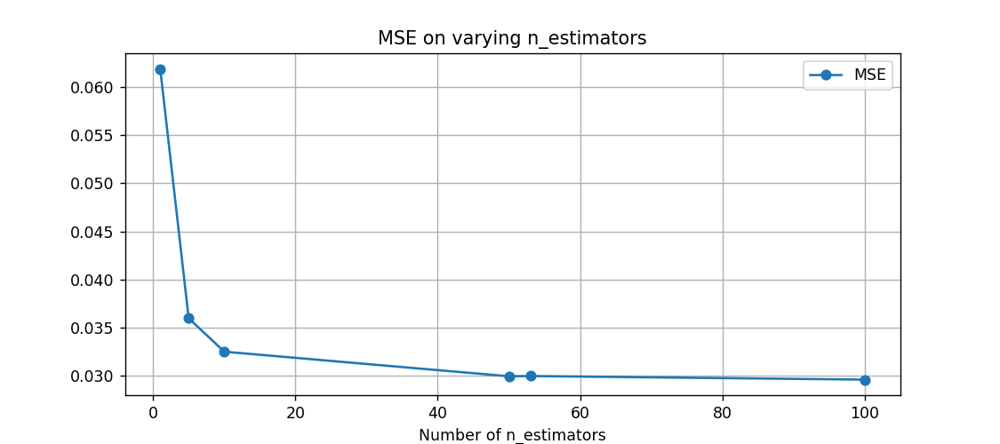

In [7]:
fig, ax = plt.subplots(figsize=(9,4))
ax.plot([1, 5, 10, 50, 53, 100], abs(accs), 'o-', label="MSE")
ax.set_title("MSE on varying n_estimators")
ax.set_xlabel("Number of n_estimators")
ax.grid()
ax.legend();

**Ora che sappiamo di poter usare 50 alberi, osserviamo quali sono le features più importanti.**

# Features importance con random forest

In [8]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

parameters = {'n_estimators':[best_n_estimators]}
model = RandomForestRegressor()

tuned_model = GridSearchCV(model,parameters, cv=5, verbose=1)
tuned_model.fit(X_train, y_train)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  4.4min finished


GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'n_estimators': [50]}, verbose=1)

<IPython.core.display.Javascript object>


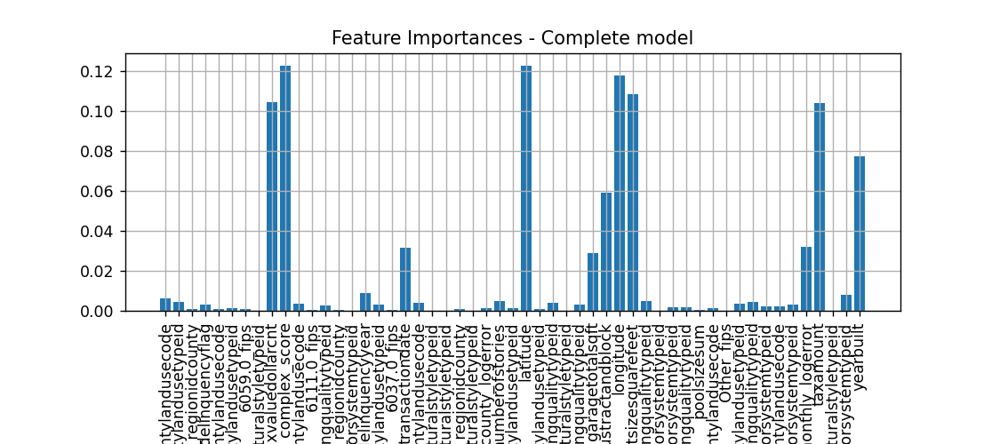

In [9]:
fig, ax = plt.subplots(figsize=(9,4))
ax.bar(range(0,len(X.columns)), tuned_model.best_estimator_.feature_importances_)
ax.set_title("Feature Importances - Complete model")
ax.set_xticks(range(len(X.columns)))
ax.set_xticklabels(X.columns, rotation = 90)
plt.gcf().subplots_adjust(bottom=0.3)
ax.grid();

**Elenco delle features in base alla loro importanza (Importanza in ordine decrescente).**

In [10]:
best_features = np.argsort(tuned_model.best_estimator_.feature_importances_)[::-1]
X.columns[best_features][:10]

Index(['complex_score', 'latitude', 'longitude', 'lotsizesquarefeet',
       'taxvaluedollarcnt', 'taxamount', 'yearbuilt', 'rawcensustractandblock',
       'median_monthly_logerror', 'transactiondate'],
      dtype='object')

# MSE on varying features

**Per vedere quante features poter utilizzare per creare un modello accurato ma il più semplice possibile**

In [11]:
from sklearn.model_selection import cross_val_score

best_features = np.argsort(tuned_model.best_estimator_.feature_importances_)[::-1]

mse_test = []
mse_train = []

rf_small = RandomForestRegressor(n_estimators=best_n_estimators)
for f in range(1,len(best_features)+1):    
    x = X[X.columns[best_features[:f]]]
    x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=42)
    
    test_scores = cross_val_score(rf_small, x_test, y_test, cv=5, scoring='neg_mean_squared_error')
    train_scores = cross_val_score(rf_small, x_train, y_train, cv=5, scoring='neg_mean_squared_error')
    mse_test += [-test_scores.mean()]
    mse_train += [-train_scores.mean()]

Test score:
Full score: 0.030044685962899977
Best score: 0.029580731291786483
Train score:
Full score: 0.029948928449550737
Best score: 0.029764331079223532


<IPython.core.display.Javascript object>


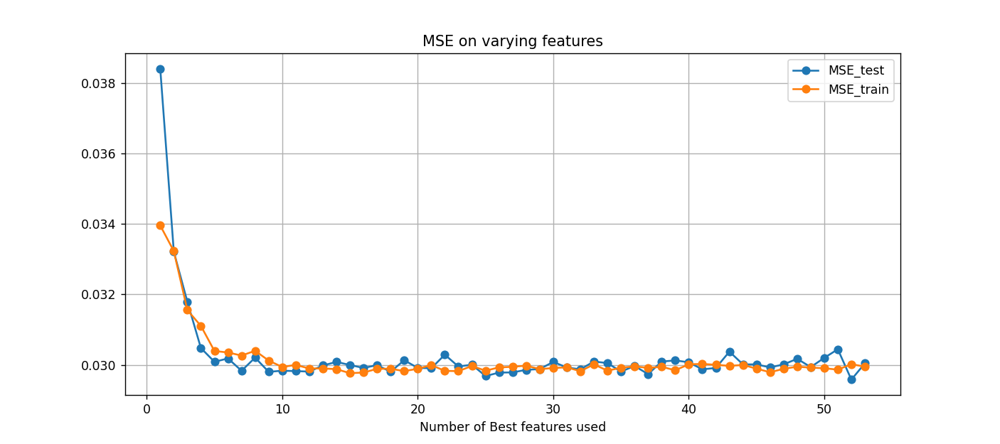

In [12]:
print("Test score:")
print ("Full score:", mse_test[-1])
print ("Best score:", min(mse_test))

print("Train score:")
print ("Full score:", mse_train[-1])
print ("Best score:", min(mse_train))

fig, ax = plt.subplots(figsize=(9,4))
ax.plot(range(1,len(best_features)+1), mse_test, 'o-', label="MSE_test")
ax.plot(range(1,len(best_features)+1), mse_train, 'o-', label="MSE_train")
ax.set_title("MSE on varying features")
ax.set_xlabel("Number of Best features used")
ax.grid();
ax.legend();

**Ora che sappiamo di poter utilizzare solo 10 features proviamo a vedere come variano le loro importanze in assenza delle altre.**

In [13]:
X = merge_17[X.columns[best_features][:10]]
y = merge_17['logerror']

In [14]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

parameters = {'n_estimators':[best_n_estimators]}
model = RandomForestRegressor()

tuned_model = GridSearchCV(model,parameters, cv=5, verbose=1)
tuned_model.fit(X_train, y_train)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  2.6min finished


GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'n_estimators': [50]}, verbose=1)

In [15]:
X.columns

Index(['complex_score', 'latitude', 'longitude', 'lotsizesquarefeet',
       'taxvaluedollarcnt', 'taxamount', 'yearbuilt', 'rawcensustractandblock',
       'median_monthly_logerror', 'transactiondate'],
      dtype='object')

<IPython.core.display.Javascript object>


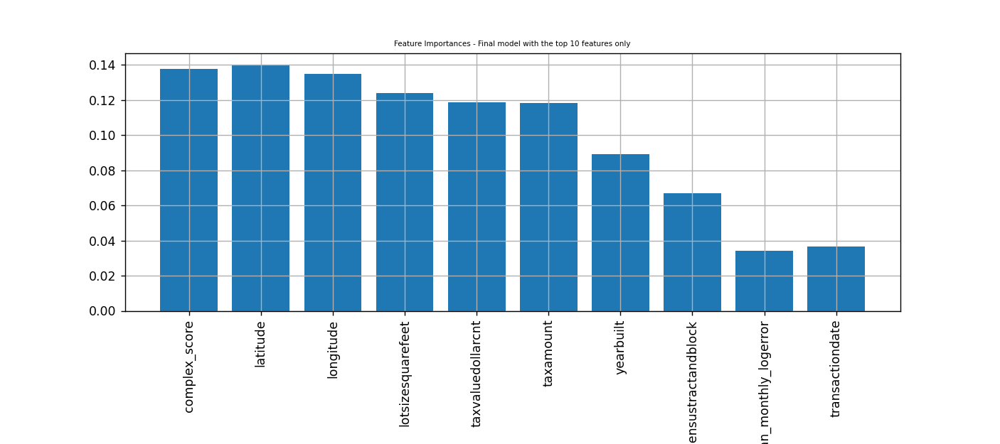

In [16]:
fig, ax = plt.subplots(figsize=(9,4))
plt.rcParams.update({'font.size': 5})
ax.bar(range(0,len(X.columns)), tuned_model.best_estimator_.feature_importances_)
ax.set_title("Feature Importances - Final model with the top 10 features only")
ax.set_xticks(range(len(X.columns)))
ax.set_xticklabels(X.columns, rotation = 90)
ax.autoscale()
plt.gcf().subplots_adjust(bottom=0.3)
ax.grid();

**Siamo soddisfatti e dunque da ora in poi saranno utilizzate solo le 10 migliori features, aumentando l'efficienza dei modelli nei processi di training e testing senza diminuire l'accuracy in maniera significativa.**

# 5. REGRESSORI

In [4]:
def predict_procedure(model, parameters, X_train, X_test, vector_train, vector_test, test_stats, y_test_preds, iteration):   
    tuned_model = GridSearchCV(estimator = model,  param_grid = parameters, cv=5, verbose=1)
    tuned_model.fit(X_train, y_train)
    
    y_train_pred = tuned_model.predict(X_train)
    y_test_pred = tuned_model.predict(X_test)

    mean_predicted_train = [np.mean(y_train_pred)] * len(y_train)
    mean_predicted_test = [np.mean(y_test_pred)] * len(y_test)

    predicted_train = mean_squared_error(y_train_pred, y_train)
    predicted_test = mean_squared_error(y_test_pred, y_test)

    vector_test.append(predicted_test)
    vector_train.append(predicted_train)

    y_test_preds = np.column_stack( [y_test_preds, y_test_pred] ) if y_test_preds.size else y_test_pred

    dt_test_bias     = (y_test-np.mean(y_test_preds))**2
    dt_test_variance = np.var(y_test_preds)
    dt_test_error    = (y_test_preds - y_test)**2
    run_test_stats = np.array([dt_test_error.mean(), dt_test_bias.mean(), dt_test_variance.mean()])
    test_stats = test_stats.append(run_test_stats) 

    print("MSE of: ", iteration)
    print("Mean predicted train: ",mean_squared_error(mean_predicted_train, y_train)," Predicted train: ",predicted_train)
    print("Mean predicted test: ",mean_squared_error(mean_predicted_test, y_test)," Predicted test: ",predicted_test)

In [5]:
def show_MSE_evolution(title, xlabel, values, vector_train, vector_test):
    fig, ax = plt.subplots(figsize=(9,4))
    ax.plot(values, vector_test, 'o-', label="MSE_test")
    ax.plot(values, vector_train, 'o-', label="MSE_train")
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.grid()
    ax.legend()

In [6]:
def show_BiasVariance_tradeoff(title, xlabel, values, test_stats):
    fig, ax = plt.subplots(figsize=(9,4))
    ax.plot(values,[i[0] for i in test_stats], 'o:', label='Error')
    ax.plot(values,[i[1] for i in test_stats], 'o:', label='Bias$^2$')
    ax.plot(values,[i[2] for i in test_stats], 'o:', label='Variance')
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.grid()
    ax.legend()

In [7]:
def best_worst_instances(model, parameters, y_test):
    tuned_model = GridSearchCV(estimator=model, param_grid = parameters, cv=5, verbose=1, scoring='neg_mean_squared_error')
    tuned_model.fit(X_train, y_train)
    
    print('Best score:',tuned_model.best_score_,', with params:', tuned_model.best_params_)
    y_test_pred = tuned_model.predict(X_test)
    print("MSE of predicted test: ",mean_squared_error(y_test_pred, y_test))

    abs_errors = np.array([])
    for i in range(len(y_test_pred)):
        abs_errors = np.append(abs_errors, [abs(y_test_pred[i] - y_test.iloc[i])]) #absolute error

    sorted_indxs = np.argsort(abs_errors)
    ten_percent = len(abs_errors) // 10
    best_instances = X_test.iloc[sorted_indxs[:ten_percent]]
    worst_instances = X_test.iloc[sorted_indxs[-ten_percent:]]
    
    return best_instances, worst_instances, tuned_model.best_params_

In [8]:
def standard_methods(model, values, tuning):
    vector_test = []
    vector_train = []
    test_stats = [] 
    
    for i in values:
        parameters = {tuning: [i]}
        y_test_preds = np.array([])
        predict_procedure(model, parameters, X_train, X_test, vector_train, vector_test, test_stats, y_test_preds, i)
    return vector_test, vector_train, test_stats

In [9]:
def ensemble_methods(improved_model, values):
    vector_test = []
    vector_train = []
    test_stats = [] 
    
    for i in values: 
        parameters = {'n_estimators':[i]}
        y_test_preds = np.array([])
        predict_procedure(improved_model, parameters, X_train, X_test, vector_train, vector_test, test_stats, y_test_preds, i)
    return vector_test, vector_train, test_stats

**Usiamo i principali metodi di regressione eseguendo tuning sui loro parametri più significativi, in modo da poter visualizzare quali siano le soluzioni migliori da adottare, confrontando sia dati di train che di test.**

# 5.A. LinearRegression

In [23]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42)

model = LinearRegression()
parameters = {'fit_intercept':[True]}

scaler = MinMaxScaler()
scaler.fit(X_train)

tuned_model = GridSearchCV(model,parameters, cv=5, verbose=1)
tuned_model.fit(scaler.transform(X_train), y_train)

y_train_pred = tuned_model.predict(scaler.transform(X_train))
y_test_pred = tuned_model.predict(scaler.transform(X_test))

mean_predicted_train = [np.mean(y_train_pred)] * len(y_train)
mean_predicted_test = [np.mean(y_test_pred)] * len(y_test)

dt_train_bias     = (y_train-mean_predicted_train)**2
dt_train_variance = np.var(mean_predicted_train)
dt_train_error    = (mean_predicted_train - y_train)**2
run_train_stats = np.array([dt_train_error.mean(), dt_train_bias.mean(), dt_train_variance.mean()])

dt_test_bias     = (y_test-mean_predicted_test)**2
dt_test_variance = np.var(mean_predicted_test)
dt_test_error    = (mean_predicted_test - y_test)**2
run_test_stats = np.array([dt_test_error.mean(), dt_test_bias.mean(), dt_test_variance.mean()])

abs_errors = np.array([])
for i in range(len(y_test_pred)):
    abs_errors = np.append(abs_errors, [abs(y_test_pred[i] - y_test.iloc[i])]) #absolute error

sorted_indxs = np.argsort(abs_errors)
ten_percent = len(abs_errors) // 10
best_instances_linear = X_test.iloc[sorted_indxs[:ten_percent]]
worst_instances_linear = X_test.iloc[sorted_indxs[-ten_percent:]]

print("TRAIN STATS: ")
print("Error:", run_train_stats[0], "\nSquared Bias:", run_train_stats[1], "\nVariance:", run_train_stats[2])
print("\nTEST STATS: ", run_test_stats)
print("Error:", run_test_stats[0], "\nSquared Bias:", run_test_stats[1], "\nVariance:", run_test_stats[2])
print("\nMSE of:")
print("Mean predicted train:",mean_squared_error(mean_predicted_train, y_train)," Predicted train:",mean_squared_error(y_train_pred, y_train))
print("Mean predicted test:",mean_squared_error(mean_predicted_test, y_test)," Predicted test:",mean_squared_error(y_test_pred, y_test))

Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


TRAIN STATS: 
Error: 0.028518049958648563 
Squared Bias: 0.028518049958648563 
Variance: 1.2037062152420224e-35

TEST STATS:  [2.83103304e-02 2.83103304e-02 1.20370622e-35]
Error: 0.02831033039893377 
Squared Bias: 0.02831033039893377 
Variance: 1.2037062152420224e-35

MSE of:
Mean predicted train: 0.0285180499586487  Predicted train: 0.0284261803687486
Mean predicted test: 0.028310330398933752  Predicted test: 0.028227140646149167


In [24]:
best_instances_linear.to_csv('best_instances_linear.csv', sep = ',', header = True, index = False)
del best_instances_linear
worst_instances_linear.to_csv('worst_instances_linear.csv', sep = ',', header = True, index = False)
del worst_instances_linear

<IPython.core.display.Javascript object>


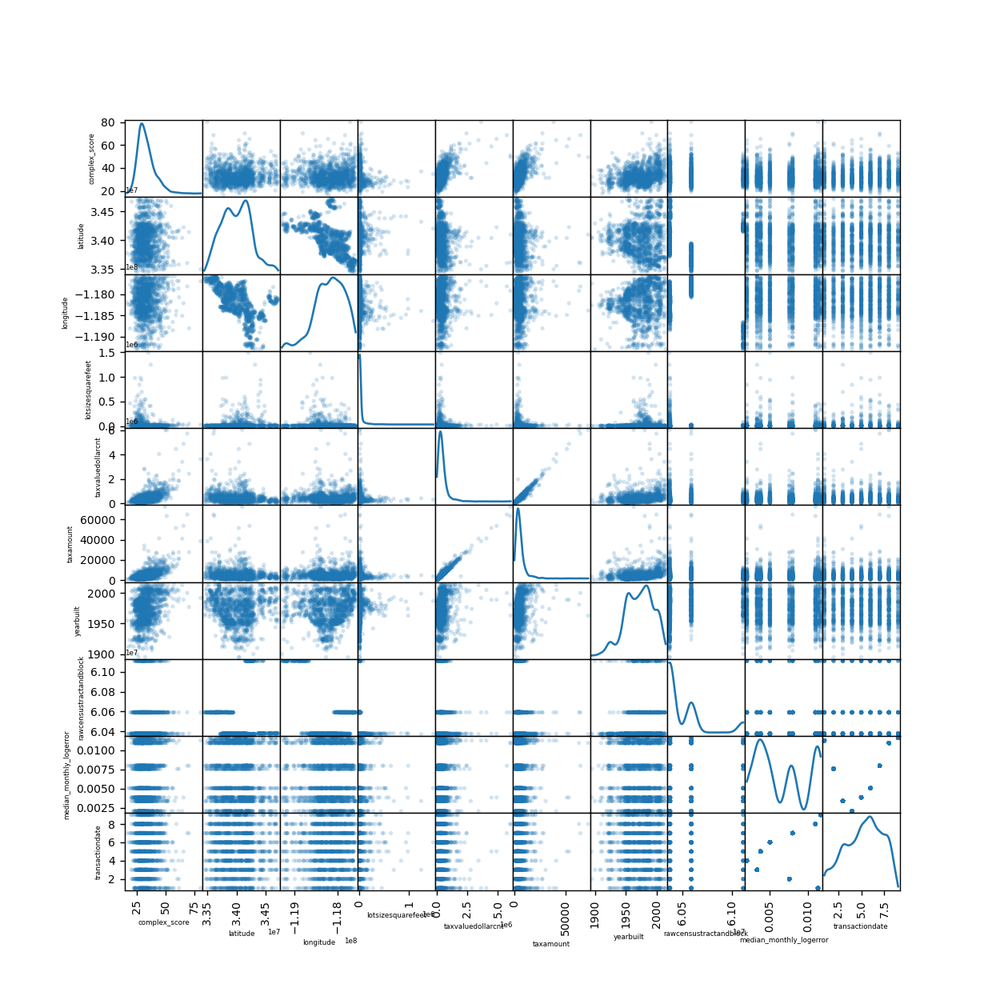

In [55]:
scatter_matrix(best_instances_linear, alpha=0.2, figsize=(10, 10), diagonal='kde');

<IPython.core.display.Javascript object>


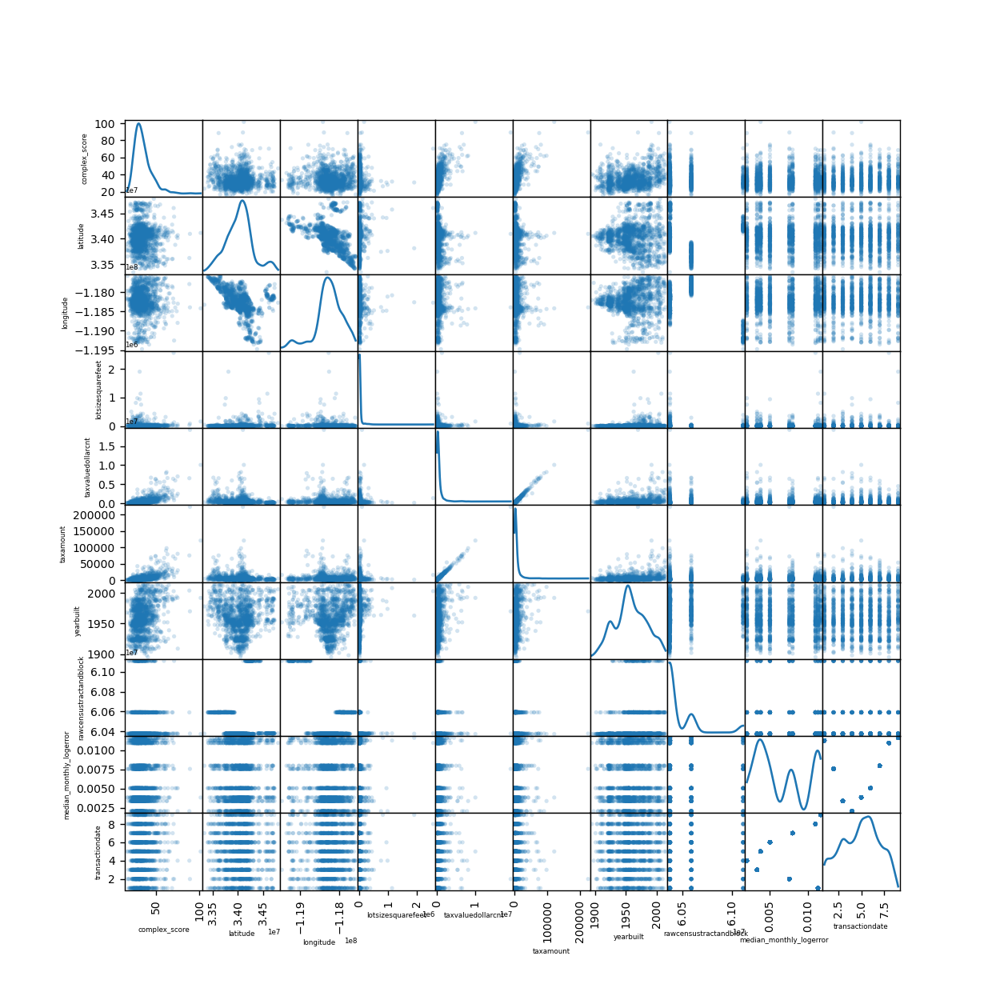

In [56]:
scatter_matrix(worst_instances_linear, alpha=0.2, figsize=(10, 10), diagonal='kde');

**Nel caso della Regressione Lineare, possiamo vedere che non c'è una differenza notevole, infatti sia train che test si aggirano su un MSE di 0.028 e differiscono solo di pochi decimillesimi.**

# 5.B. DecisionTree

In [25]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
values = [2, 3, 5, 10, 50, 100, 250, 500]
model = DecisionTreeRegressor()
parameters = {'max_leaf_nodes' : values}
best_instances_dt, worst_instances_dt, bestparams_dt = best_worst_instances(model, parameters, y_test)
mln = bestparams_dt['max_leaf_nodes']

Fitting 5 folds for each of 8 candidates, totalling 40 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  40 out of  40 | elapsed:    9.3s finished


Best score: -0.028480514825666475 , with params: {'max_leaf_nodes': 5}
MSE of predicted test:  0.028447326072487306


In [26]:
vector_test, vector_train, test_stats = standard_methods(DecisionTreeRegressor(), values, 'max_leaf_nodes')

Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


MSE of:  2
Mean predicted train:  0.028518049958648706  Predicted train:  0.02845859087637758
Mean predicted test:  0.028310367510665842  Predicted test:  0.02850510598239913
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


MSE of:  3
Mean predicted train:  0.0285180499586487  Predicted train:  0.02842764325275087
Mean predicted test:  0.02831035979522856  Predicted test:  0.028442524220123493
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


MSE of:  5
Mean predicted train:  0.028518049958648706  Predicted train:  0.02814804365693982
Mean predicted test:  0.028310110397347037  Predicted test:  0.028447326072487306
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.8s finished


MSE of:  10
Mean predicted train:  0.028518049958648706  Predicted train:  0.027931328922133725
Mean predicted test:  0.028310100632781634  Predicted test:  0.028433712830388466
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.2s finished


MSE of:  50
Mean predicted train:  0.0285180499586487  Predicted train:  0.026145755392590387
Mean predicted test:  0.02830991509292782  Predicted test:  0.03058884881161887
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.4s finished


MSE of:  100
Mean predicted train:  0.028518049958648706  Predicted train:  0.02467349330372533
Mean predicted test:  0.02830998529849311  Predicted test:  0.033617407049975526
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.9s finished


MSE of:  250
Mean predicted train:  0.028518049958648706  Predicted train:  0.021802378732067685
Mean predicted test:  0.028310169165290344  Predicted test:  0.03608806093734443
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    2.2s finished


MSE of:  500
Mean predicted train:  0.0285180499586487  Predicted train:  0.01846440956566943
Mean predicted test:  0.028311863854512943  Predicted test:  0.041524267492823015


**Usando un albero di decisione e facendo il tuning con diverse quantità massime di foglie, possiamo notare un andamento divergente tra il train ed il test di ogni caso, infatti all'aumentare del numero di foglie, l'errore nel caso del train diminuisce ed in quello del test aumenta, arrivando anche a differire di qualche centesimo. Mostriamo questa progressione nel grafico sottostante.**

<IPython.core.display.Javascript object>


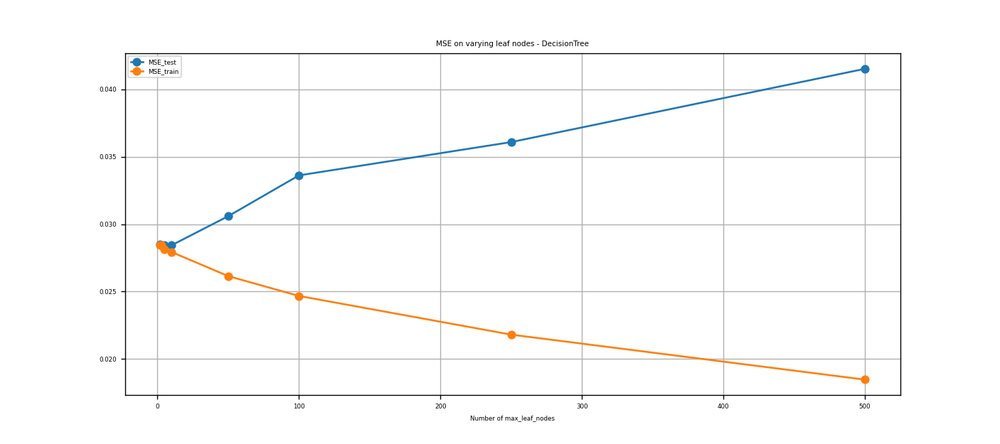

In [27]:
show_MSE_evolution('MSE on varying leaf nodes - DecisionTree', 'Number of max_leaf_nodes', values, vector_train, vector_test)

<IPython.core.display.Javascript object>


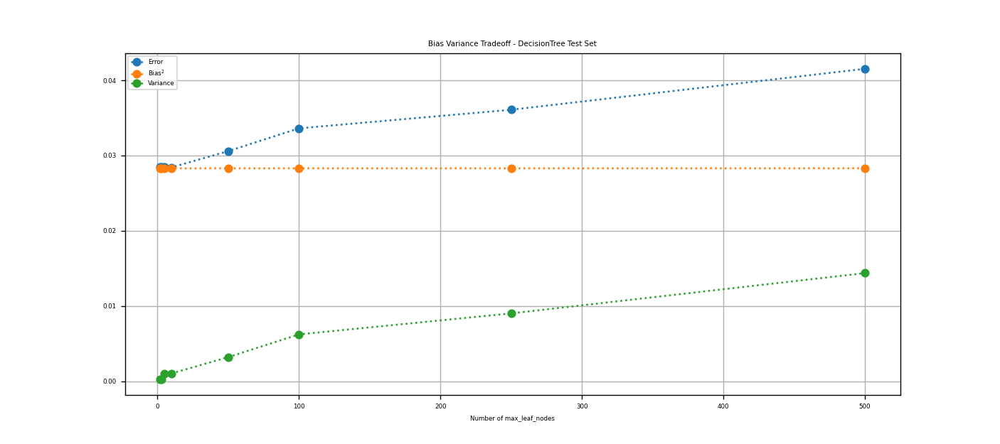

In [28]:
show_BiasVariance_tradeoff('Bias Variance Tradeoff - DecisionTree Test Set', 'Number of max_leaf_nodes', values, test_stats)

In [29]:
best_instances_dt.to_csv('best_instances_dt.csv', sep = ',', header = True, index = False)
del best_instances_dt
worst_instances_dt.to_csv('worst_instances_dt.csv', sep = ',', header = True, index = False)
del worst_instances_dt

<IPython.core.display.Javascript object>


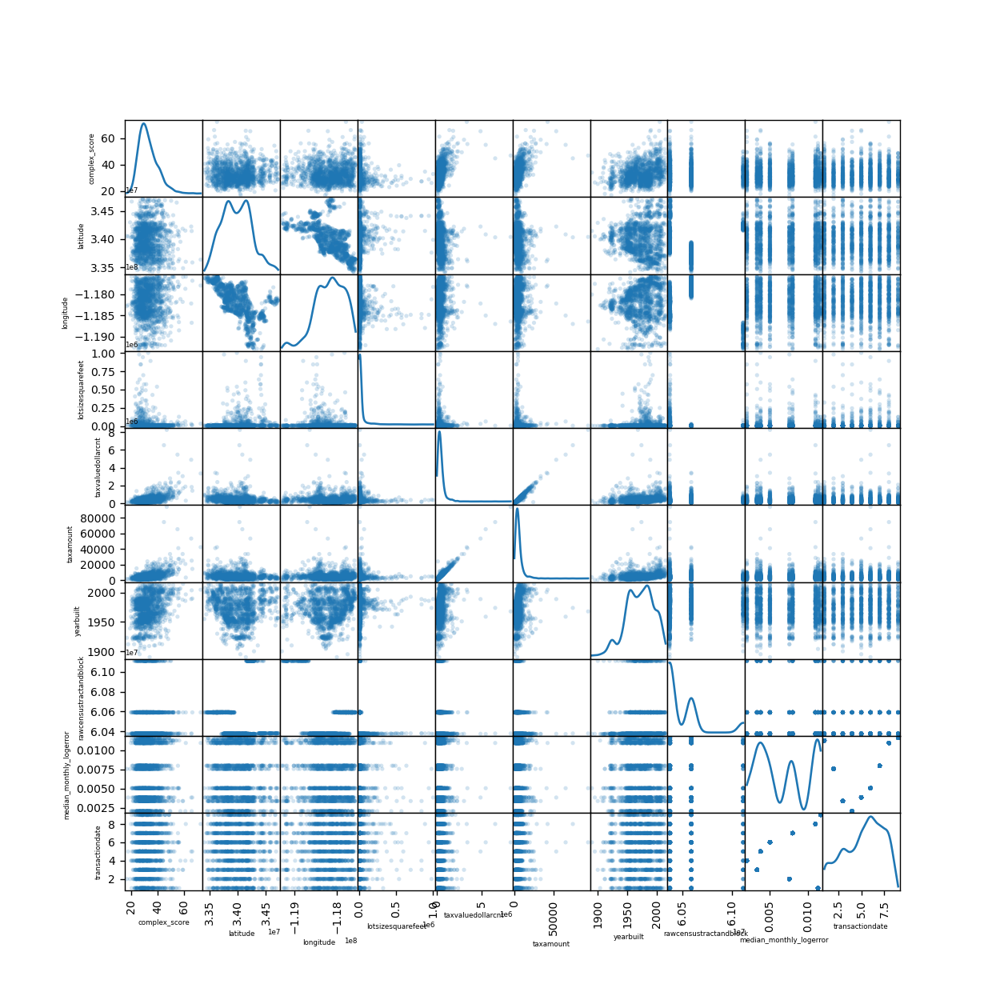

In [57]:
scatter_matrix(best_instances_dt, alpha=0.2, figsize=(10, 10), diagonal='kde');

<IPython.core.display.Javascript object>


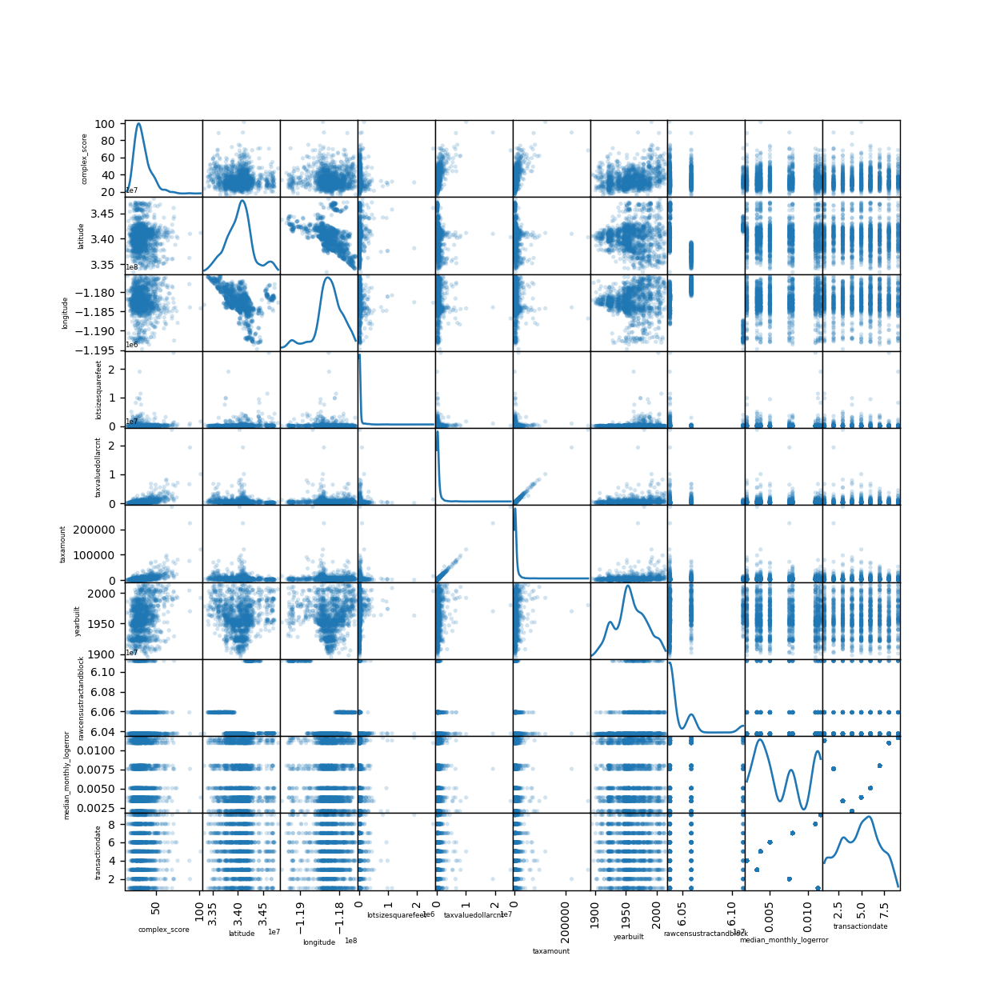

In [58]:
scatter_matrix(worst_instances_dt, alpha=0.2, figsize=(10, 10), diagonal='kde');

# 5.C. DecisionTree con Bagging

**Vedendo i risultati del MSE nell'esperimento precedente abbiamo notato che il predittore che ritorna il valore medio risulta essere piuttosto accurato, perciò la perdita di precisione potrebbe essere dovuta alla varianza. Per accertarcene, abbiamo applicato il Bagging, il quale diminuendo la varianza, dovrebbe risolvere il problema.**

In [13]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
values = [1, 5 , 10, 50, 53, 100]
model = DecisionTreeRegressor(max_leaf_nodes=mln)
parameters = {'n_estimators': values}
best_instances_dt_bg, worst_instances_dt_bg, bestparams_dt_bg = best_worst_instances(BaggingRegressor(base_estimator = model), parameters, y_test)

Fitting 5 folds for each of 6 candidates, totalling 30 fits
Best score: -0.02846999878216221 , with params: {'n_estimators': 50}
MSE of predicted test:  0.02811874107580323


In [14]:
vector_test, vector_train, test_stats = ensemble_methods(BaggingRegressor(base_estimator = model), values)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
MSE of:  1
Mean predicted train:  0.02851858358859573  Predicted train:  0.028493587810974014
Mean predicted test:  0.028309911960947294  Predicted test:  0.028628549506490727
Fitting 5 folds for each of 1 candidates, totalling 5 fits
MSE of:  5
Mean predicted train:  0.028518069090675304  Predicted train:  0.028285688008925086
Mean predicted test:  0.02831051291450395  Predicted test:  0.02826885573612354
Fitting 5 folds for each of 1 candidates, totalling 5 fits
MSE of:  10
Mean predicted train:  0.028518118420449313  Predicted train:  0.02821165870919312
Mean predicted test:  0.028310855291222008  Predicted test:  0.028394602683704494
Fitting 5 folds for each of 1 candidates, totalling 5 fits
MSE of:  50
Mean predicted train:  0.028518066324706926  Predicted train:  0.028175567160248462
Mean predicted test:  0.02831048424830302  Predicted test:  0.0281258180971652
Fitting 5 folds for each of 1 candidates, totalling 5 fits
MS

<IPython.core.display.Javascript object>


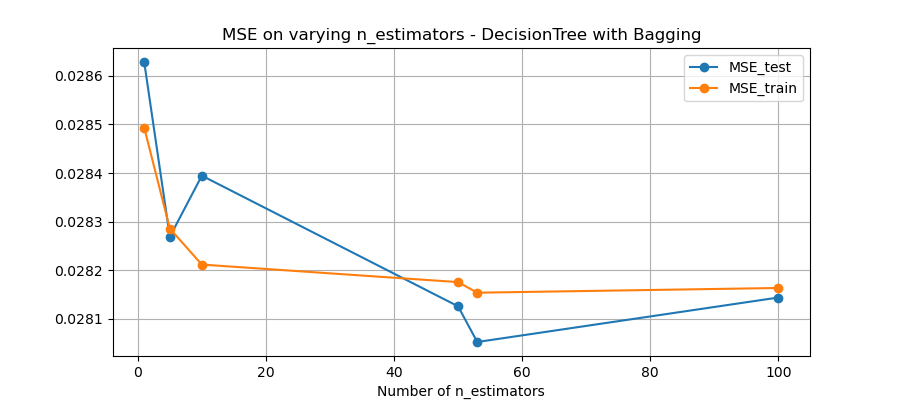

In [15]:
show_MSE_evolution('MSE on varying n_estimators - DecisionTree with Bagging', 'Number of n_estimators', values, vector_train, vector_test)

<IPython.core.display.Javascript object>


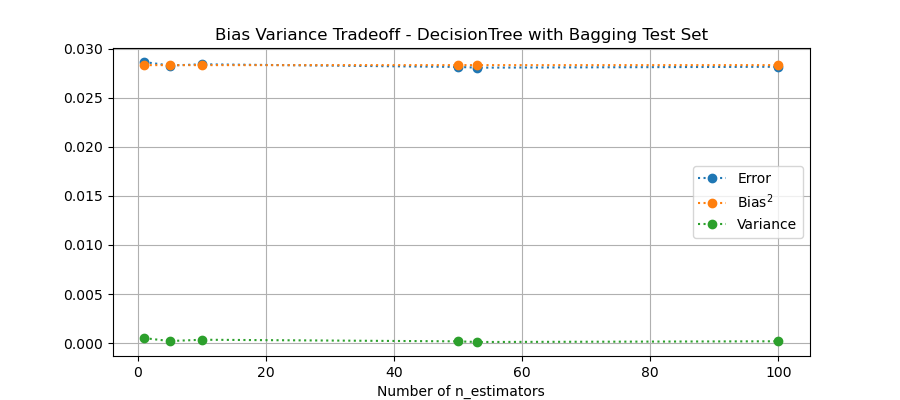

In [16]:
show_BiasVariance_tradeoff('Bias Variance Tradeoff - DecisionTree with Bagging Test Set', 'Number of n_estimators', values, test_stats)

In [47]:
best_instances_dt_bg.to_csv('best_instances_dt_bg.csv', sep = ',', header = True, index = False)
del best_instances_dt_bg
worst_instances_dt_bg.to_csv('worst_instances_dt_bg.csv', sep = ',', header = True, index = False)
del worst_instances_dt_bg

<IPython.core.display.Javascript object>


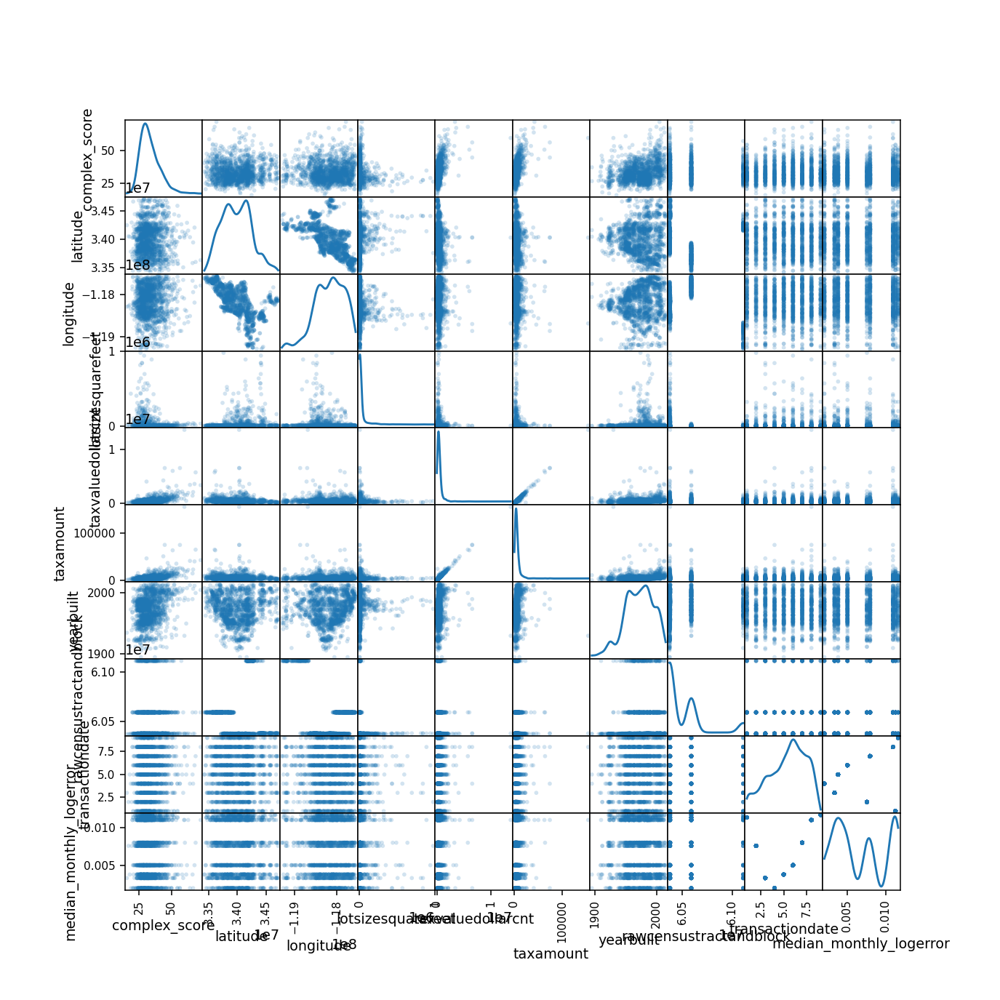

In [8]:
scatter_matrix(best_instances_dt_bg, alpha=0.2, figsize=(10, 10), diagonal='kde');

<IPython.core.display.Javascript object>


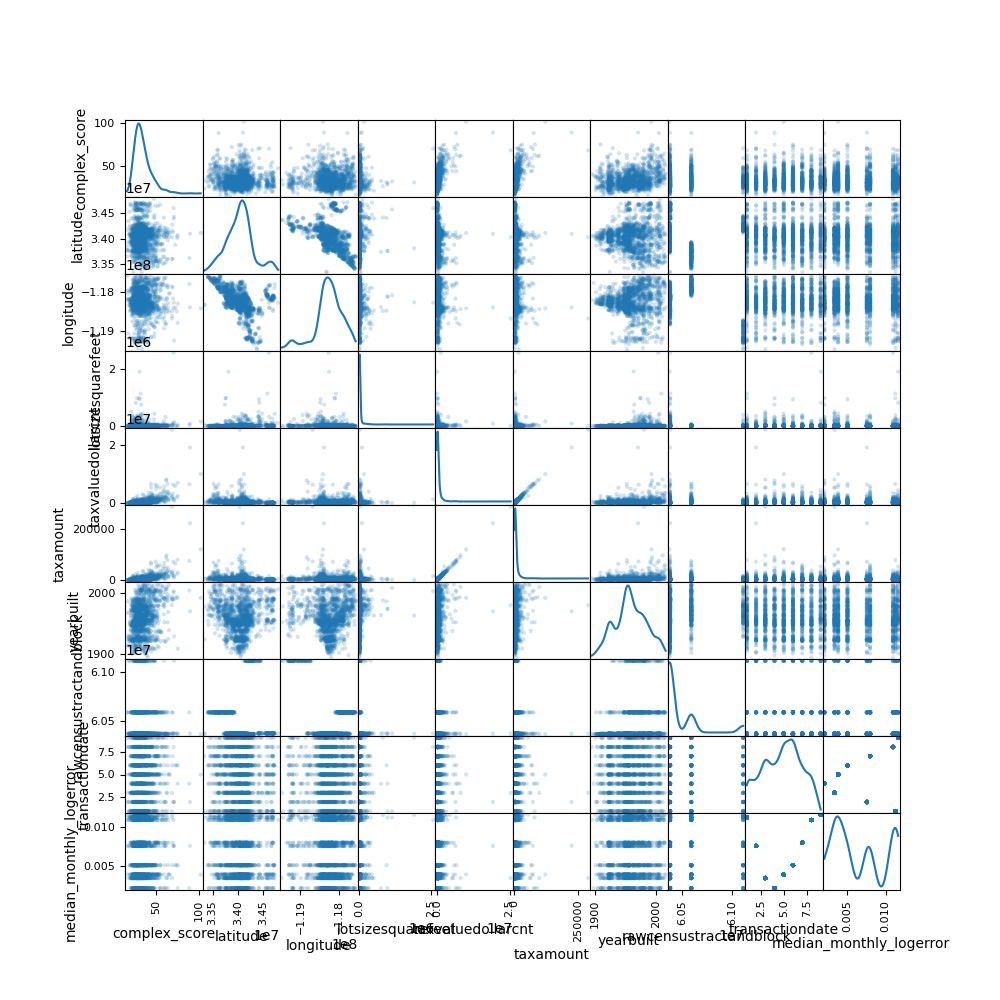

In [6]:
scatter_matrix(worst_instances_dt_bg, alpha=0.2, figsize=(10, 10), diagonal='kde');

# 5.D. DecisionTree con AdaBoost

**Per dimostrare che il Bias del modello del DecisionTree non varia molto, si può utilizzare il metodo AdaBoost per vedere se si presentano eventuali cambiamenti, tuttavia dato il riscontro già positivo, non è previsto che succeda.**

In [18]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
values = [1, 5, 10, 50, 53, 100, 200]
model = DecisionTreeRegressor(max_leaf_nodes=mln)
parameters = {'n_estimators' : values}
best_instances_dt_bs, worst_instances_dt_bs, bestparams_dt_bs = best_worst_instances(AdaBoostRegressor(base_estimator = model), parameters, y_test)

Fitting 5 folds for each of 7 candidates, totalling 35 fits
Best score: -0.028743443669750506 , with params: {'n_estimators': 1}
MSE of predicted test:  0.028660884797208908


In [19]:
vector_test, vector_train, test_stats = ensemble_methods(AdaBoostRegressor(base_estimator = model), values)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
MSE of:  1
Mean predicted train:  0.02851885353138857  Predicted train:  0.028365122326771776
Mean predicted test:  0.028309950396488443  Predicted test:  0.02787269159141709
Fitting 5 folds for each of 1 candidates, totalling 5 fits
MSE of:  5
Mean predicted train:  0.028784656441557616  Predicted train:  0.028676151818262496
Mean predicted test:  0.028554128027604823  Predicted test:  0.028388375381214217
Fitting 5 folds for each of 1 candidates, totalling 5 fits
MSE of:  10
Mean predicted train:  0.029635319054335148  Predicted train:  0.031645726153262055
Mean predicted test:  0.02937258234112863  Predicted test:  0.03151331257004488
Fitting 5 folds for each of 1 candidates, totalling 5 fits
MSE of:  50
Mean predicted train:  0.06302580490530306  Predicted train:  0.12171613497235538
Mean predicted test:  0.0632277217630029  Predicted test:  0.12445142798866968
Fitting 5 folds for each of 1 candidates, totalling 5 fits
MSE 

<IPython.core.display.Javascript object>


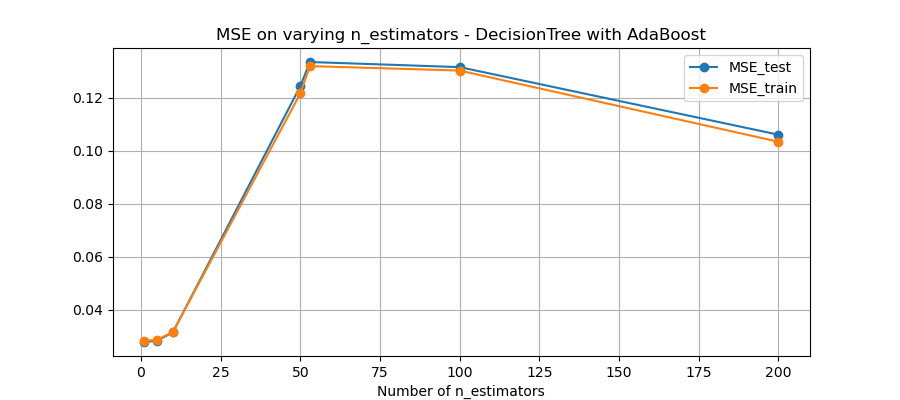

In [20]:
show_MSE_evolution('MSE on varying n_estimators - DecisionTree with AdaBoost', 'Number of n_estimators', values, vector_train, vector_test)

<IPython.core.display.Javascript object>


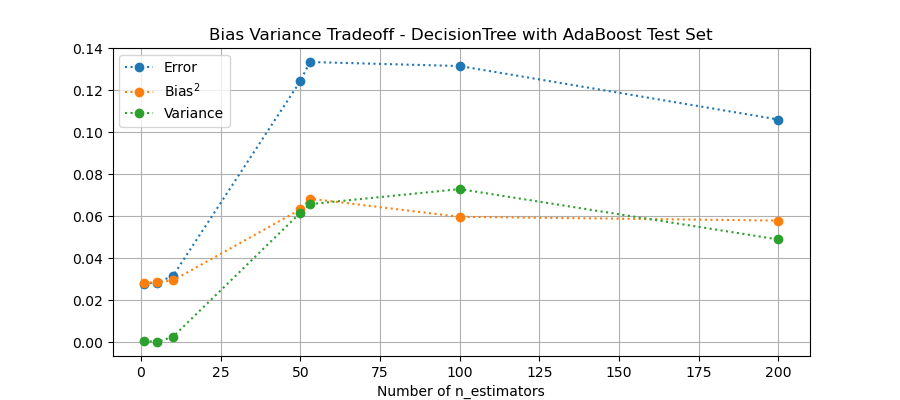

In [21]:
show_BiasVariance_tradeoff('Bias Variance Tradeoff - DecisionTree with AdaBoost Test Set', 'Number of n_estimators', values, test_stats)

In [58]:
best_instances_dt_bs.to_csv('best_instances_dt_bs.csv', sep = ',', header = True, index = False)
del best_instances_dt_bs
worst_instances_dt_bs.to_csv('worst_instances_dt_bs.csv', sep = ',', header = True, index = False)
del worst_instances_dt_bs

<IPython.core.display.Javascript object>


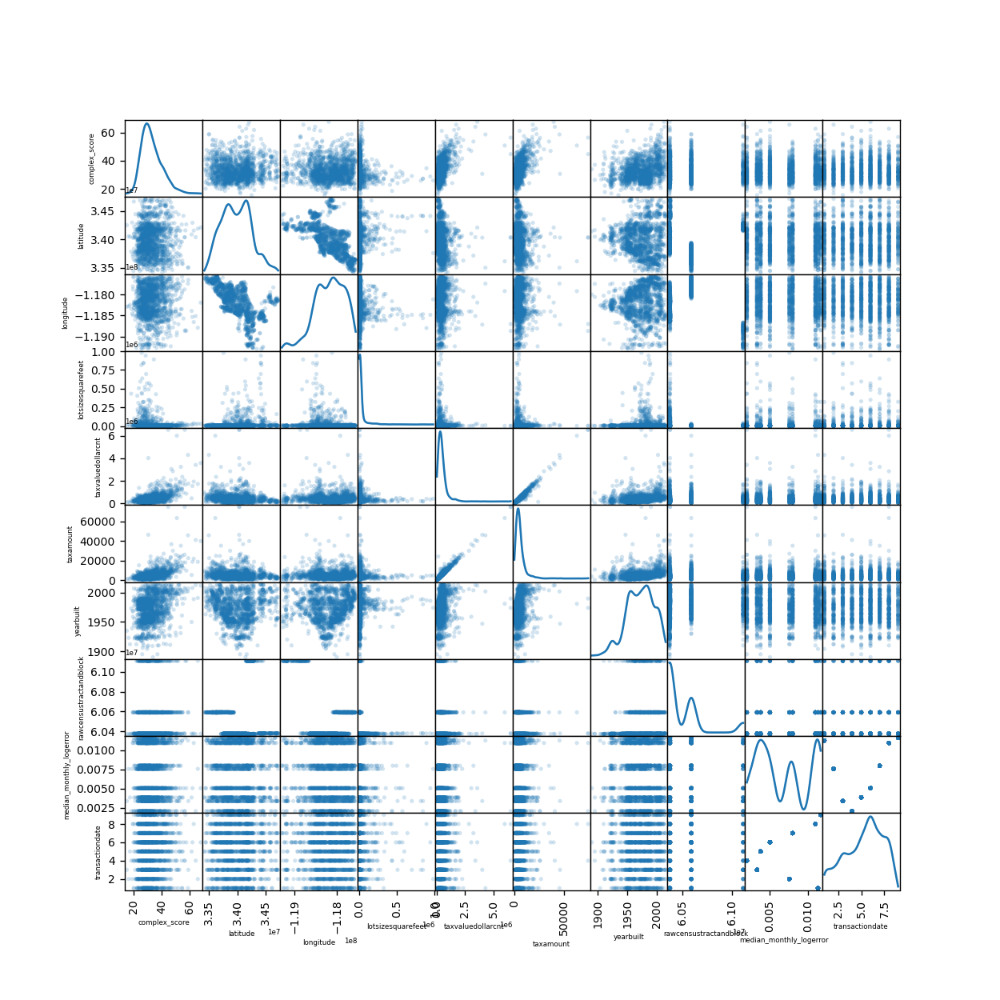

In [61]:
scatter_matrix(best_instances_dt_bs, alpha=0.2, figsize=(10, 10), diagonal='kde');

<IPython.core.display.Javascript object>


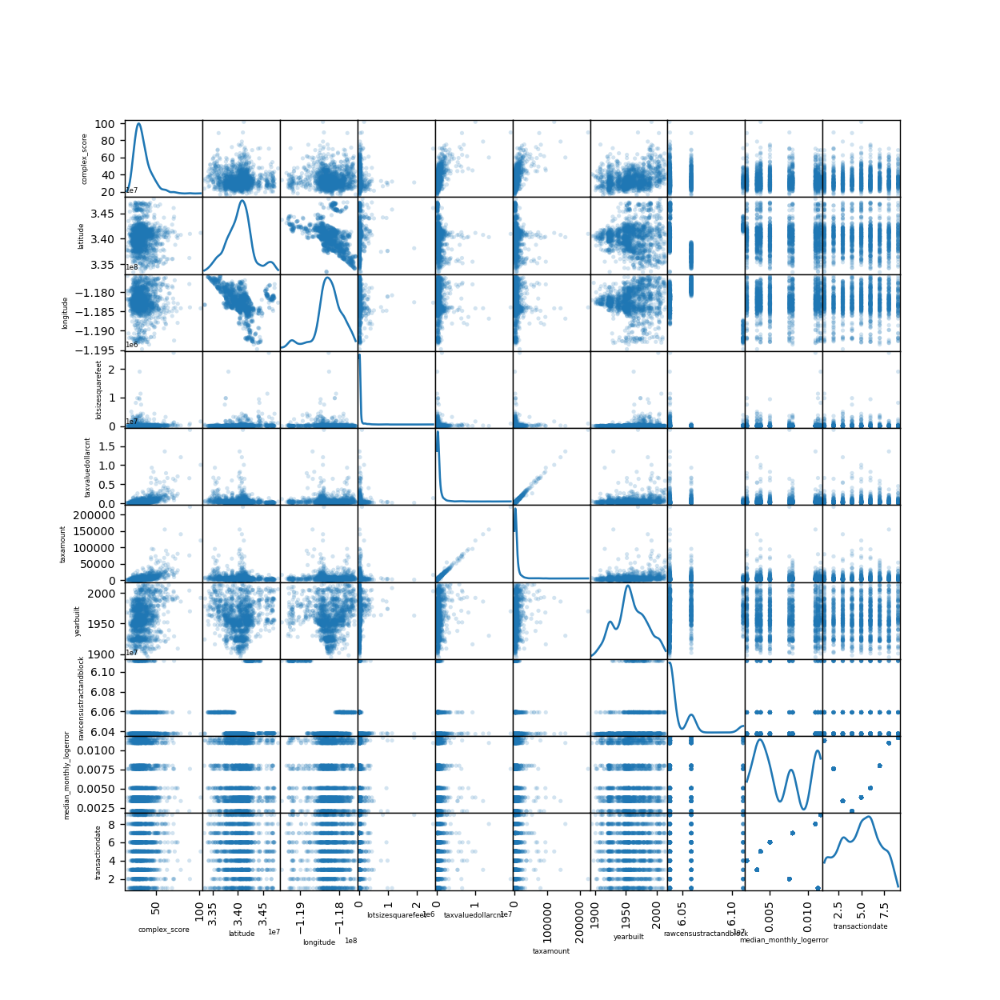

In [62]:
scatter_matrix(worst_instances_dt_bs, alpha=0.2, figsize=(10, 10), diagonal='kde');

# 5.E. RandomForest

In [40]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
values = [1, 5 , 10, 50, 53, 100]
model = RandomForestRegressor()
parameters = {'n_estimators' : [best_n_estimators]}
best_instances_rf, worst_instances_rf, bestparams_rf = best_worst_instances(model, parameters, y_test)

Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  2.6min finished


Best score: -0.02993787975950723 , with params: {'n_estimators': 50}
MSE of predicted test:  0.029710975686043573


In [41]:
vector_test, vector_train, test_stats = standard_methods(RandomForestRegressor(), values, 'n_estimators')

Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    3.2s finished


MSE of:  1
Mean predicted train:  0.028519108289616103  Predicted train:  0.02315341110523835
Mean predicted test:  0.028312047757198425  Predicted test:  0.06268486261506637
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   15.5s finished


MSE of:  5
Mean predicted train:  0.028521046725699536  Predicted train:  0.007537559302077346
Mean predicted test:  0.028316199666744018  Predicted test:  0.036114927233335405
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   30.6s finished


MSE of:  10
Mean predicted train:  0.028518437008905634  Predicted train:  0.006018546480777742
Mean predicted test:  0.028312499915686237  Predicted test:  0.031802308194724536
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  2.6min finished


MSE of:  50
Mean predicted train:  0.028518610515293228  Predicted train:  0.0042744355018973995
Mean predicted test:  0.028314996143167473  Predicted test:  0.02985032802366603
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  2.8min finished


MSE of:  53
Mean predicted train:  0.02851894687783349  Predicted train:  0.004357357653129063
Mean predicted test:  0.028314921758828198  Predicted test:  0.029672918953116217
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  5.2min finished


MSE of:  100
Mean predicted train:  0.028518833871382477  Predicted train:  0.004151548268618793
Mean predicted test:  0.02831455537509238  Predicted test:  0.02932283439211886


**Nel grafico sotto, si può vedere che train e test hanno un andamento simile, diviso solo da una differenza apparentemente costante al variare del numero di stimatori.**

<IPython.core.display.Javascript object>


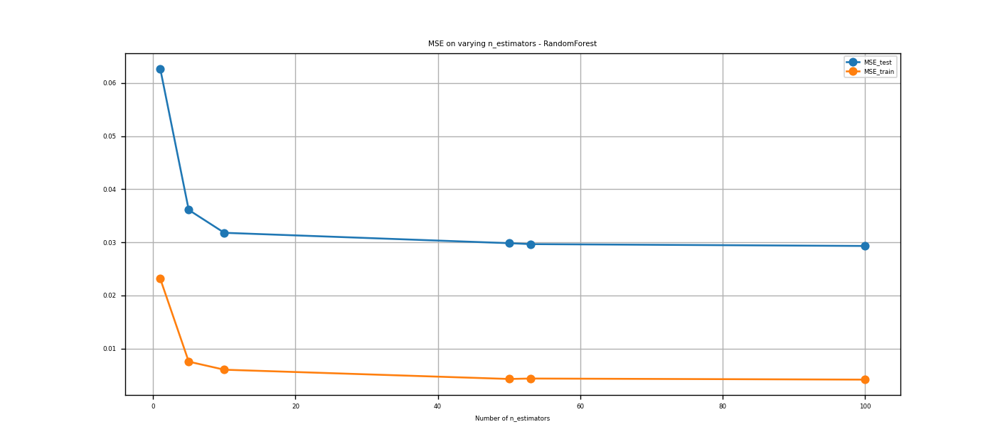

In [42]:
show_MSE_evolution('MSE on varying n_estimators - RandomForest', 'Number of n_estimators', values, vector_train, vector_test)

<IPython.core.display.Javascript object>


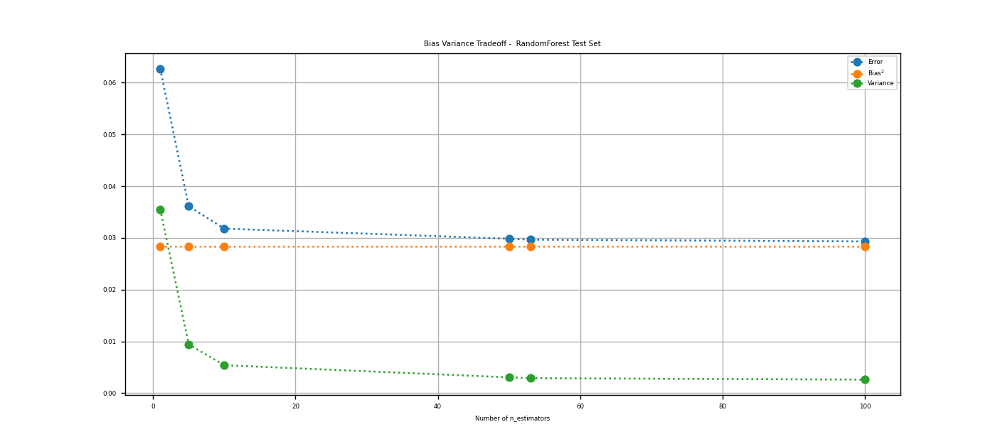

In [43]:
show_BiasVariance_tradeoff('Bias Variance Tradeoff -  RandomForest Test Set', 'Number of n_estimators', values, test_stats)

In [44]:
best_instances_rf.to_csv('best_instances_rf.csv', sep = ',', header = True, index = False)
del best_instances_rf
worst_instances_rf.to_csv('worst_instances_rf.csv', sep = ',', header = True, index = False)
del worst_instances_rf

C:\Users\Utente\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\tools.py:185: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(**fig_kw)


<IPython.core.display.Javascript object>


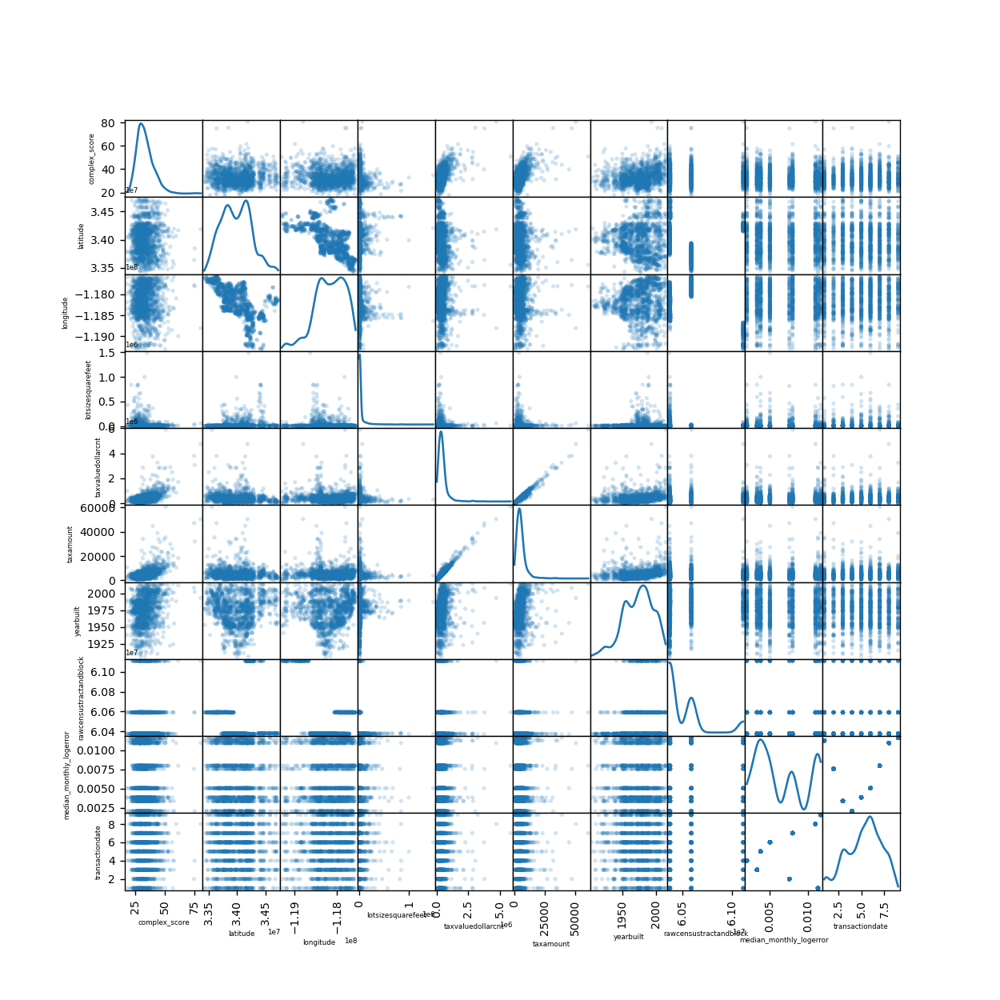

In [63]:
scatter_matrix(best_instances_rf, alpha=0.2, figsize=(10, 10), diagonal='kde');

<IPython.core.display.Javascript object>


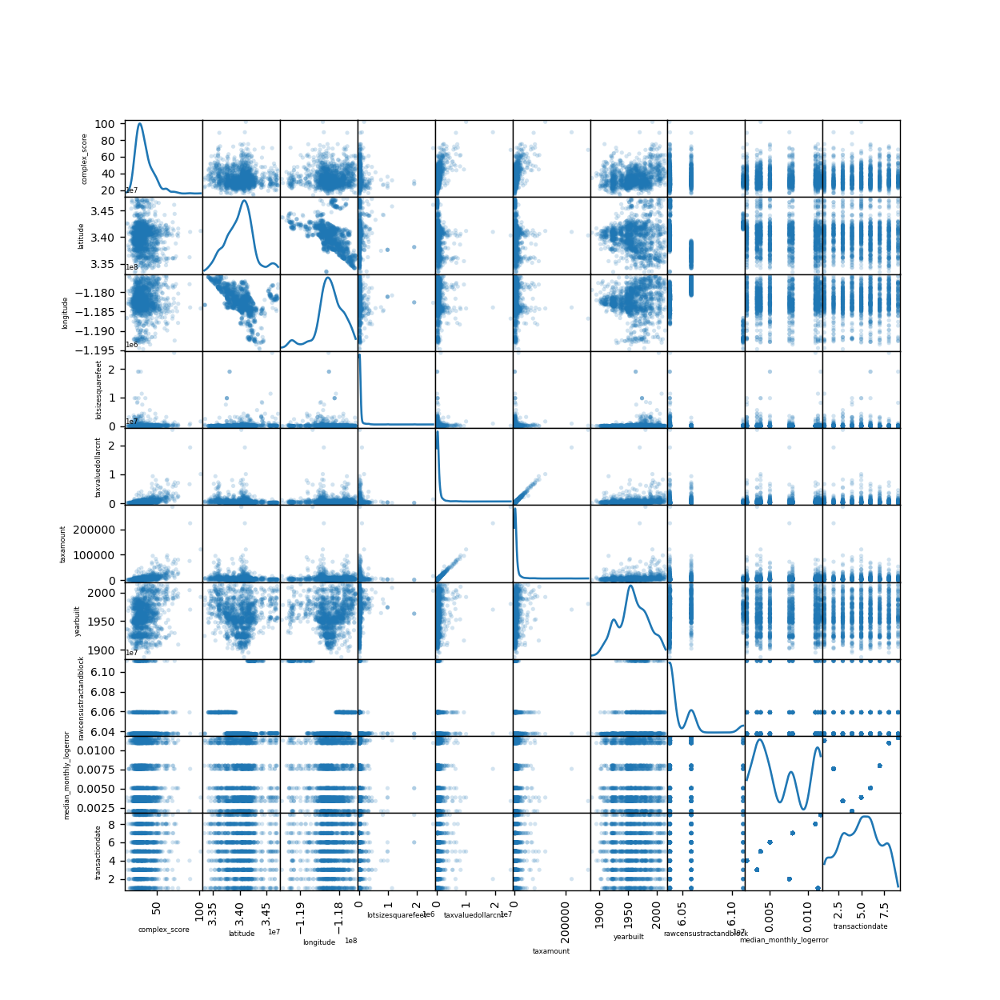

In [64]:
scatter_matrix(worst_instances_rf, alpha=0.2, figsize=(10, 10), diagonal='kde');

**Dopo queste analisi, per ogni regressore, non è stata trovata una relazione tra features che seguisse una particolare distribuzione nota. L'unica osservazione che vale la pena di menzionare è che le colonne 'taxvaluedollarcnt' e 'taxamount' sono linearmente correlate, quindi probabilmente se si togliesse una delle due, la correttezza dei modelli non cambierebbe molto.** 

**Nessun modello risulta essere considerevolmente più adatto rispetto agli altri. Facciamo una menzione particolare al DecisionTree, che peggiora notevolmente all'aumentare del valore del proprio iper parametro.**

# 6. Conclusioni

**In seguito, vengono mostrate le istanze del dataset che risultano essere state predette meglio e peggio da tutti i regressori, raccolte in due dataframe. Possiamo osservare che la cardinalità delle migliori è notevolmente più bassa rispetto alle peggiori.**

**BEST INSTANCES**

In [2]:
best_instances_linear = pd.read_csv('best_instances_linear.csv')
best_instances_dt = pd.read_csv('best_instances_dt.csv')
best_instances_dt_bg = pd.read_csv('best_instances_dt_bg.csv')
best_instances_dt_bs = pd.read_csv('best_instances_dt_bs.csv')
best_instances_rf = pd.read_csv('best_instances_rf.csv')

In [4]:
best_instances = pd.merge(best_instances_linear, best_instances_dt, how='inner')
best_instances = pd.merge(best_instances, best_instances_dt_bg, how='inner')
best_instances = pd.merge(best_instances, best_instances_dt_bs, how='inner')
best_instances = pd.merge(best_instances, best_instances_rf, how='inner')
best_instances

,complex_score,latitude,longitude,lotsizesquarefeet,taxvaluedollarcnt,taxamount,yearbuilt,rawcensustractandblock,median_monthly_logerror,transactiondate,...,Other_heatingorsystemtypeid,Other_fips,3.0_architecturalstyletypeid,Other_buildingqualitytypeid,median_county_logerror,122_propertycountylandusecode,248.0_propertylandusetypeid,Other_propertylandusetypeid,numberofstories,8.0_architecturalstyletypeid
0,34.847286,34234585.0,-118814387.0,7242.0,489371.0,5701.84,1990.0,6.111008e+07,0.003830,5,...,0,0,0,0,0.006856,0,0,0,1.0,0
1,36.855574,34058635.0,-118047293.0,3975.0,480285.0,6505.02,2004.0,6.037434e+07,0.005049,6,...,0,0,0,0,0.006472,0,0,0,1.0,0
2,28.489764,34155400.0,-118249000.0,14194.0,410000.0,4450.07,1973.0,6.037302e+07,0.011297,1,...,0,0,0,0,0.006472,0,0,0,1.0,0
3,26.025628,33989036.0,-118094640.0,5287.0,383000.0,4850.80,1952.0,6.037501e+07,0.007992,7,...,0,0,0,0,0.006472,0,0,0,1.0,0
4,33.783625,33755932.0,-118040271.0,2701.0,248071.0,3308.18,1974.0,6.059100e+07,0.003368,3,...,0,0,0,0,0.007018,1,0,0,2.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109,34.585642,33740716.0,-117863283.0,7000.0,419213.0,5024.94,1938.0,6.059075e+07,0.007578,2,...,0,0,0,0,0.007018,1,0,0,1.0,0
110,23.685439,33983552.0,-118118690.0,7800.0,218376.0,3486.75,1942.0,6.037532e+07,0.010971,8,...,0,0,0,0,0.006472,0,0,0,1.0,0
111,32.485894,34714658.0,-118147109.0,9007.0,175637.0,2870.41,1992.0,6.037901e+07,0.007992,7,...,0,0,0,0,0.006472,0,0,0,1.0,0
112,37.155080,33636396.0,-117621199.0,5130.0,338062.0,4319.84,1990.0,6.059032e+07,0.003830,5,...,0,0,0,0,0.007018,1,0,0,1.0,0


**WORST INSTANCES**

In [3]:
worst_instances_linear = pd.read_csv('worst_instances_linear.csv')
worst_instances_dt = pd.read_csv('worst_instances_dt.csv')
worst_instances_dt_bg = pd.read_csv('worst_instances_dt_bg.csv')
worst_instances_dt_bs = pd.read_csv('worst_instances_dt_bs.csv')
worst_instances_rf = pd.read_csv('worst_instances_rf.csv')

In [6]:
worst_instances = pd.merge(worst_instances_linear, worst_instances_dt, how='inner')
worst_instances = pd.merge(worst_instances, worst_instances_dt_bg, how='inner')
worst_instances = pd.merge(worst_instances, worst_instances_dt_bs, how='inner')
worst_instances = pd.merge(worst_instances, worst_instances_rf, how='inner')
worst_instances

,complex_score,latitude,longitude,lotsizesquarefeet,taxvaluedollarcnt,taxamount,yearbuilt,rawcensustractandblock,median_monthly_logerror,transactiondate,...,Other_heatingorsystemtypeid,Other_fips,3.0_architecturalstyletypeid,Other_buildingqualitytypeid,median_county_logerror,122_propertycountylandusecode,248.0_propertylandusetypeid,Other_propertylandusetypeid,numberofstories,8.0_architecturalstyletypeid
0,33.491292,34374072.0,-119475416.0,5813.0,1075583.0,16350.94,1952.0,6.111001e+07,0.003368,3,...,0,0,0,0,0.006856,0,0,0,1.0,0
1,45.840303,34191149.0,-118846401.0,20002.0,929826.0,9790.42,1963.0,6.111007e+07,0.011297,1,...,0,0,0,0,0.006856,0,0,0,1.0,0
2,36.106324,33965695.0,-118117587.0,8576.0,334613.0,4165.08,1950.0,6.037551e+07,0.007578,2,...,0,0,0,0,0.006472,0,0,0,1.0,0
3,31.984371,33951255.0,-118121039.0,12278.0,86311.0,1271.46,1948.0,6.037551e+07,0.002041,4,...,0,0,0,0,0.006472,0,0,0,1.0,0
4,37.509999,34190060.0,-118150160.0,7027.0,555715.0,6614.37,1942.0,6.037460e+07,0.003830,5,...,0,0,0,0,0.006472,0,0,0,1.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
955,73.817342,34043556.0,-118493250.0,7625.0,1976022.0,23293.32,1994.0,6.037701e+07,0.005049,6,...,0,0,0,1,0.006472,0,0,0,1.0,0
956,58.050266,33646905.0,-117805441.0,11840.0,1658137.0,17022.04,1992.0,6.059063e+07,0.011644,9,...,0,0,0,0,0.007018,1,0,0,1.0,0
957,23.079572,34109571.0,-118377070.0,7641.0,913725.0,11084.69,1932.0,6.037194e+07,0.011644,9,...,0,0,0,0,0.006472,0,0,0,1.0,0
958,36.492008,34200000.0,-118631000.0,7206.0,424414.0,5191.12,2009.0,6.037134e+07,0.003368,3,...,0,0,0,0,0.006472,0,0,0,1.0,0


**Confrontando le distribuzioni delle colonne più importanti con le istanze migliori e peggiori, possiamo notare delle notevoli differenze tra i diversi casi.**

**Latitude, longitude e yearbuilt si distinguono maggiormente dalle altre, data la differenza di distribuzione tra i due insiemi. In particolare, gli errori della prima hanno un picco di densità oltre 3.4, per cui si delinea già una zona geografica nella quale vi è una maggiore tendenza a sbagliare, mentre nella seconda questo fenomeno avviene sotto la soglia del -1.180. Infine l'ultima considerevole, che rappresenta l'anno di costruzione, mostra una maggiore densità prima del 1970. Nel caso delle istanze migliori invece, questi sono anche i punti aldilà dei quali vi è una quantità maggiore di casi positivi, il che sta ad indicare la significatività di queste soglie.**

**Per le nostre custom features, complex_score e median_monthly_logerror, notiamo che gli insiemi assumono dei trend simili, ma che differiscono perchè le istanze per cui solitamente si sbaglia assumono valori distribuiti meno equamente, come deducibile dalla differenza di ampiezza dei picchi. Le altre features hanno risultati molto simili.**

<IPython.core.display.Javascript object>


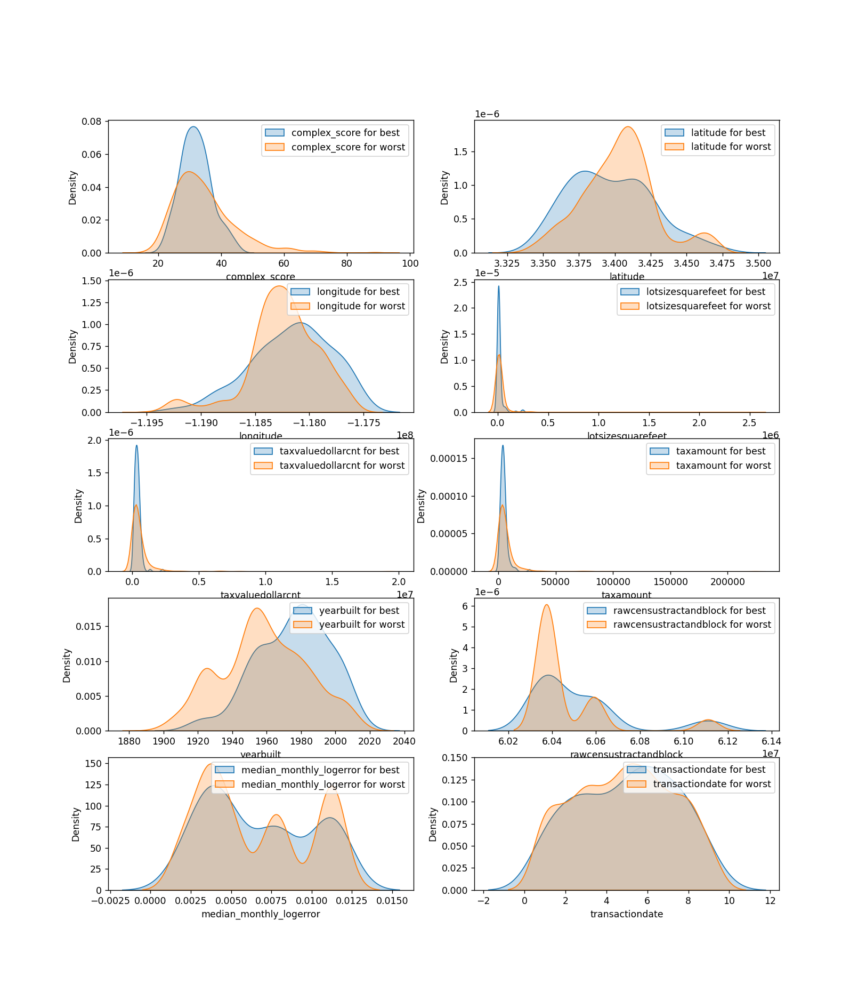

In [7]:
fig, axs = plt.subplots(ncols=2, nrows=5, figsize=(13,15))

for i, ax in enumerate(axs.flatten()):
    column = best_instances.columns[i]
    sns.kdeplot(data=best_instances[column], label= column+' for best', fill=True, ax=ax)
    sns.kdeplot(data=worst_instances[column], label=column+' for worst', fill=True, ax=ax)

    ax.legend()
    plt.show()